In [1]:
%matplotlib inline
%load_ext memory_profiler
import sys
import os
import numpy as np
import pandas as pd
import scanpy as sc
import datetime
import scipy
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import colors

#Read config file
import configparser as config
import os
config = config.ConfigParser()
config.read('./config.ini')
data_path=config['PATHS']["wd"]
os.chdir(data_path)

sc.settings.verbosity = 2         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=100)
sc._settings.n_jobs = 5
sc._settings.max_memory = 80 #GB

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.3 scipy==1.4.1 pandas==0.25.3 scikit-learn==0.22 statsmodels==0.10.2 python-igraph==0.7.1 louvain==0.6.1


In [2]:
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

In [3]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [4]:
%%R
#.libPaths()
# Load all the R libraries we will be using in the notebook
library(scran)        #preprocessing
library(RColorBrewer) #visualization
library(clusterExperiment) #visualization
library(ggplot2)
library(plyr)
library(MAST)         #differential expression analysis
#library(slingshot)   #pseudotime and trajectory inference
#library(monocle)     #pseudotime and trajectory inference
#library(gam)          #finding genes that change over pseudotime

# Read Data

In [11]:
results_file = data_path+'/GSE130888_RAW/H/results_2.h5ad'  
filenames = [data_path+"/GSE130888_RAW/H/GSM3755693/",
             data_path+"/GSE130888_RAW/H/GSM3755694/",
             data_path+"/GSE130888_RAW/H/GSM3755695/"]
sample_string = ["GSM3755693", "GSM3755694", "GSM3755695"]
sample_id = ["0","1","2"]

In [9]:
#read first data
adata = sc.read_10x_mtx(filenames[0], var_names="gene_symbols", cache=True)
adata.obs["sample"] = [sample_string[0]]*adata.n_obs
adata.obs["batch"] = ["batch_0"]*adata.n_obs
adata.var_names_make_unique() 
adata

# read additional data
for index,filepath in enumerate(filenames[1:], start=1):
    print(index, filepath)
    adata_tmp = sc.read_10x_mtx(filepath, var_names="gene_symbols", cache=True)
    adata_tmp.obs["sample"] = [sample_string[index]]*adata_tmp.n_obs
    adata_tmp.obs["sample_id"] = [str(index)]*adata_tmp.n_obs
    adata_tmp.obs["batch"] = ["batch_"+str(index)]*adata_tmp.n_obs
    adata_tmp.var_names_make_unique() 
    
    #concatenate to main data
    adata = adata.concatenate(adata_tmp, batch_key='sample_id')
    adata.obs.drop(columns=['sample_id'], inplace=True)

... reading from cache file cache/mnt-dzl_bioinf-gaedckes-scrna-pipeline-Kidney_202001-GSE130888_RAW-H-GSM3755693-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


1 /mnt/dzl_bioinf/gaedckes/scrna-pipeline/Kidney_202001/GSE130888_RAW/H/GSM3755694/
... reading from cache file cache/mnt-dzl_bioinf-gaedckes-scrna-pipeline-Kidney_202001-GSE130888_RAW-H-GSM3755694-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


2 /mnt/dzl_bioinf/gaedckes/scrna-pipeline/Kidney_202001/GSE130888_RAW/H/GSM3755695/
... reading from cache file cache/mnt-dzl_bioinf-gaedckes-scrna-pipeline-Kidney_202001-GSE130888_RAW-H-GSM3755695-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


In [10]:
#adata.obs["batch"]# = adata.obs["batch"].astype("category")
np.unique(adata.obs["batch"])

array(['batch_0', 'batch_1', 'batch_2'], dtype=object)

sum(adata[: , "CX3CR1"].X > 0)

# **Preprocessing:**

## Quality controll:  
take thesholds and filter options from Si *et al.* (2019)

In [12]:
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
mito_genes = adata.var_names.str.startswith('MT-') # get mt genes
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['n_genes'] = (adata.X > 0).sum(1).A1

#to find thresholds use:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [13]:
sc.pp.filter_cells(adata, min_genes=200, inplace=True) #remove cell if less then 200 genes in cell expressed
sc.pp.filter_genes(adata, min_cells=3, inplace=True)   #remove gene if less then 3 cells express the gene

#filter out cells with more then 30% mt genes:
print(adata[adata.obs.percent_mito >= 0.3, :].shape[0], " cells were removed with more then 30% mt genes")
adata = adata[adata.obs.percent_mito < 0.3, :]

filtered out 36 cells that haveless than 200 genes expressed
filtered out 11922 genes that are detectedin less than 3 cells
167  cells were removed with more then 30% mt genes


Trying to set attribute `.obs` of view, making a copy.
... storing 'batch' as categorical
Trying to set attribute `.obs` of view, making a copy.
... storing 'sample' as categorical
Trying to set attribute `.var` of view, making a copy.
... storing 'feature_types' as categorical


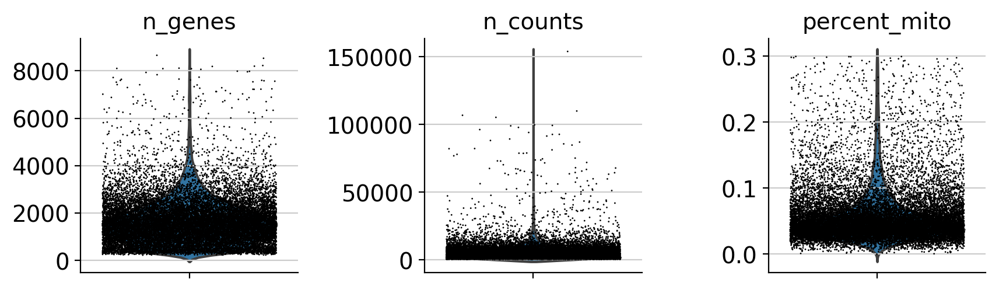

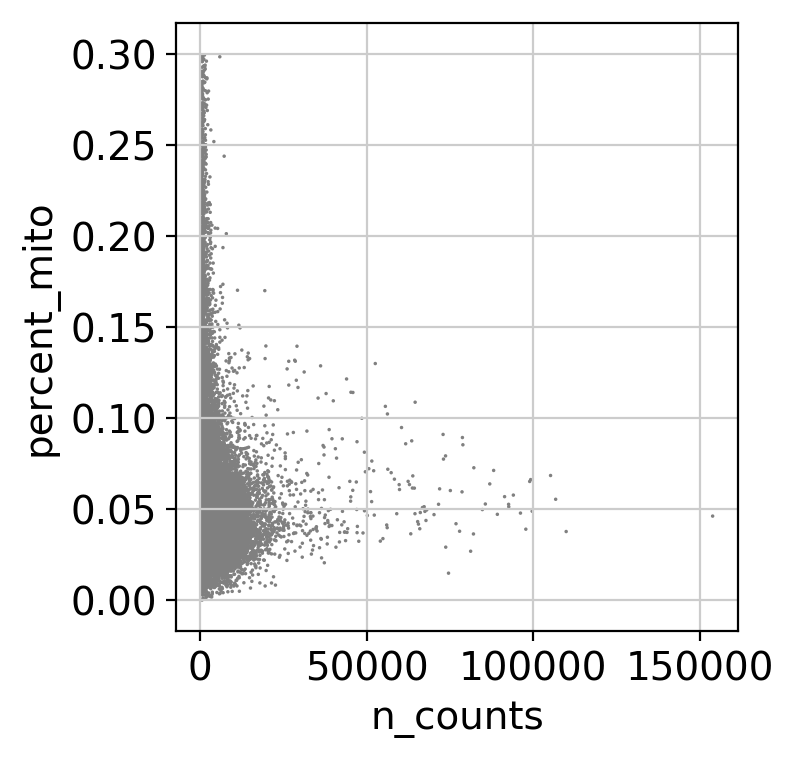

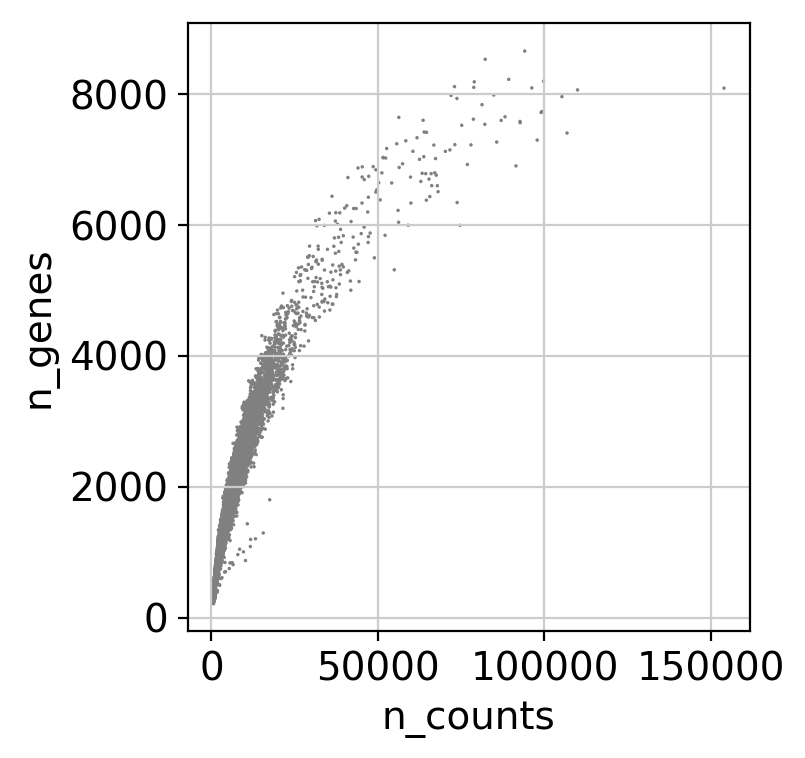

In [14]:
#after filtering:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],jitter=0.4, multi_panel=True)#, groupby="sample")
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

## **Normalization and Log**
#### using CPM 

adata[:,"CD4"].X

In [15]:
adata_pp = adata.copy() 
sc.pp.normalize_total(adata_pp, target_sum=1e6, exclude_highly_expressed=True)    # CPM, normalize per cell!!
sc.pp.log1p(adata_pp)                                                             # log
#adata.raw = adata  # save current data (normlaized and log-transformed) as raw

Normalizing counts per cell. The following highly-expressed genes are not considered during normalization factor computation:
['PLA2G2A', 'S100A9', 'S100A8', 'ITLN1', 'IGKC', 'COL3A1', 'APOD', 'JCHAIN', 'CXCL10', 'HSPA1A', 'HLA-DRA', 'COL1A2', 'TMSB4X', 'TIMP1', 'FABP4', 'CCL21', 'HBB', 'FTH1', 'MALAT1', 'TAGLN', 'MGP', 'LYZ', 'LUM', 'FOS', 'IGHA2', 'IGHG4', 'IGHG2', 'IGHA1', 'IGHG1', 'IGHM', 'B2M', 'TPSB2', 'TPSAB1', 'MT2A', 'CCL2', 'CCL4', 'COL1A1', 'CST3', 'SLPI', 'CFD', 'FTL', 'IGLC2', 'IGLC3', 'MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-CO3', 'MT-ND4']
    finished (0:00:00):normalized adata.X


#### Scran

In [16]:
#Perform a clustering for scran normalization in clusters
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='batch', resolution=0.5)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 15
    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 15


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diag

    finished (0:00:06)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:01)


In [17]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['batch']
data_mat = adata.X.T

In [18]:
%%R -i data_mat -i input_groups -o size_factors
size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

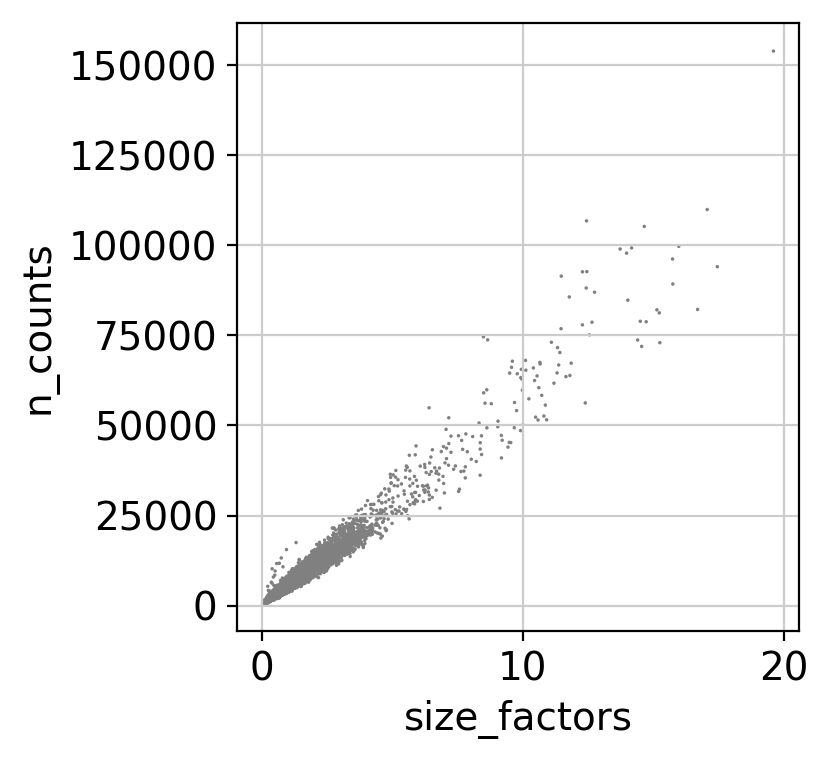

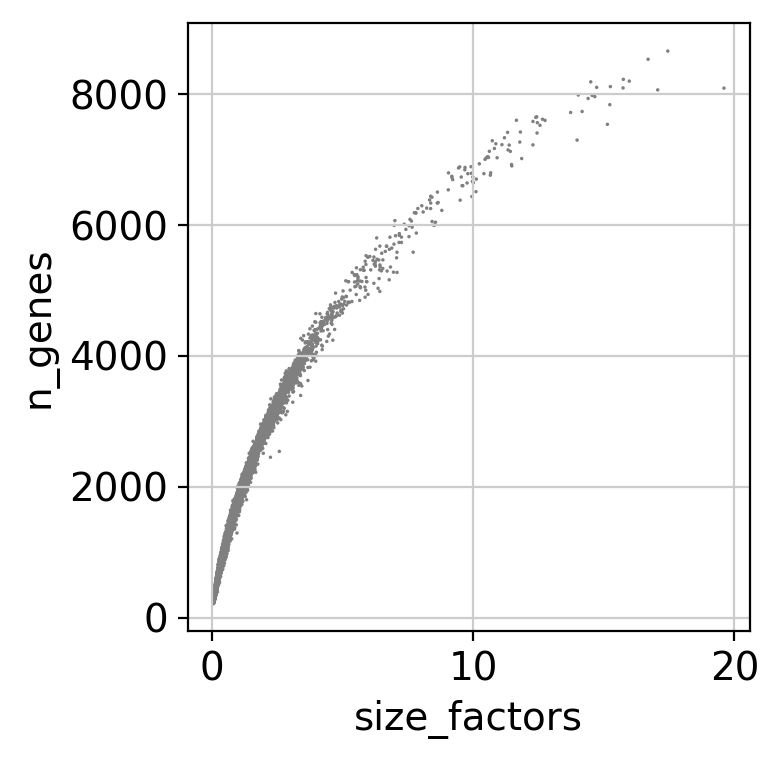

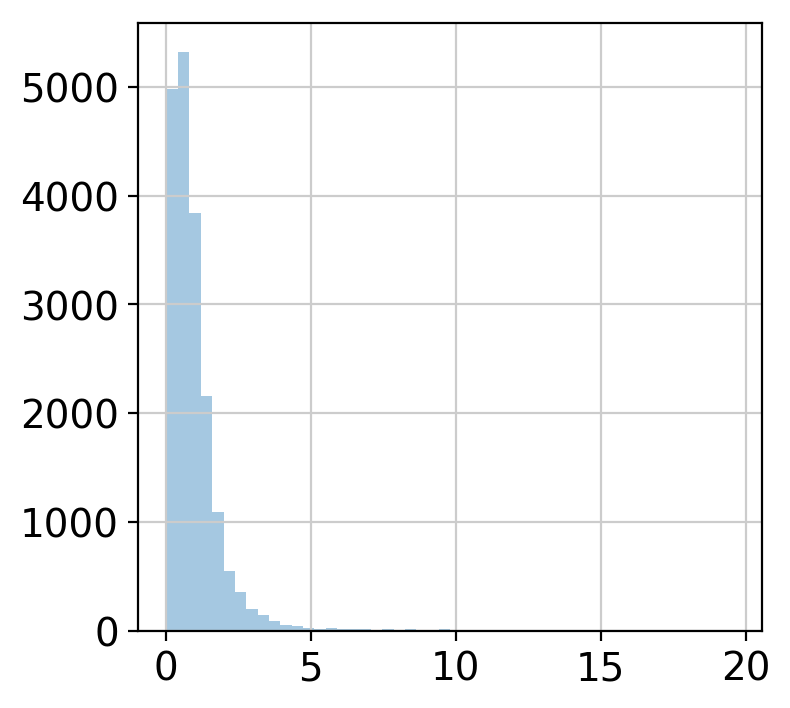

In [19]:
#Delete adata_pp
del adata_pp

# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors
sc.pl.scatter(adata, 'size_factors', 'n_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes')
sb.distplot(size_factors, bins=50, kde=False)
plt.show()

In [20]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()

#Normalize adata 
adata.X /= adata.obs['size_factors'].values[:,None]
adata.X = scipy.sparse.csr_matrix(adata.X) #convert dense back to spares
sc.pp.log1p(adata)

# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata #normalized and log-transformed with an offset of 1

## Batch correction
batch consist of:  
- cells on different chips,
- cells in different sequencing lanes  
- cells harvested at different time points
- differing environments

computing PCA with n_comps = 50
    finished (0:00:36)
computing neighbors
    using 'X_pca' with n_pcs = 10


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html

    finished (0:00:04)
computing UMAP
    finished (0:00:18)


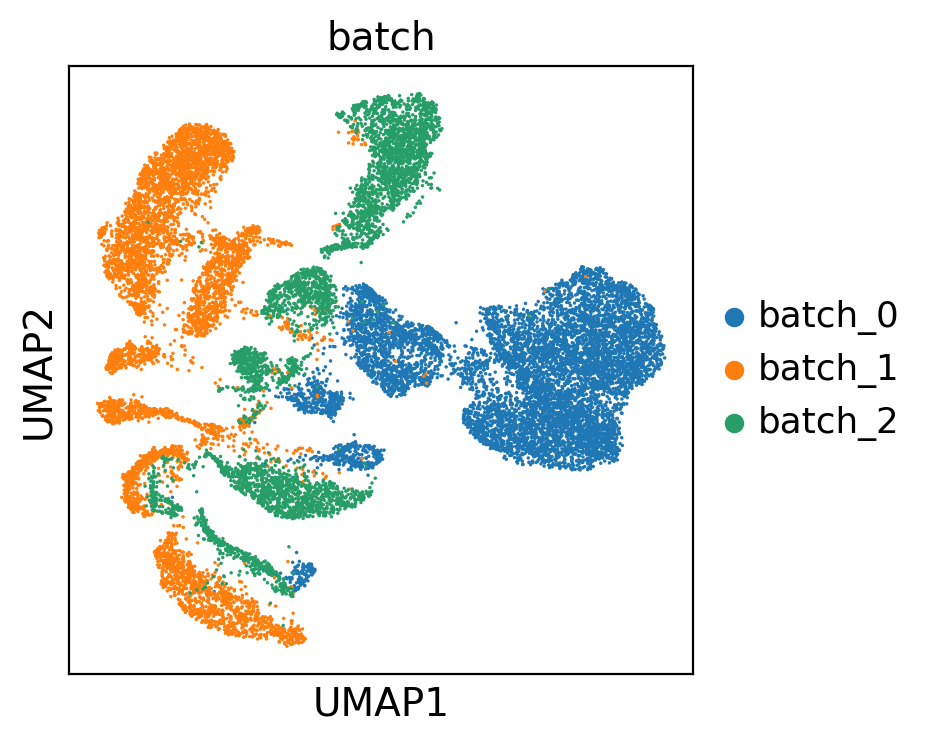

In [21]:
sc.pp.pca(adata, svd_solver='arpack')#, use_highly_variable=True)
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=10)
sc.tl.umap(adata)
sc.pl.umap(adata, color='batch', use_raw=False)

In [22]:
#ComBat batch correction
sc.pp.combat(adata, key="batch") #ComBat batch correction can produce negative expression values
#sc.pp.regress_out(adata, "batch")

Standardizing Data across genes.

Found 3 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments



/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py:269: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "_it_sol" failed type inference due to: Cannot unify array(float64, 2d, C) and array(float64, 1d, C) for 'sum2', defined at /mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py (311)

File "../../../exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py", line 311:
def _it_sol(s_data, g_hat, d_hat, g_bar, t2, a, b, conv=0.0001) -> Tuple[float, float]:
    <source elided>
        g_new = (t2*n*g_hat + d_old*g_bar) / (t2*n + d_old)
        sum2 = s_data - g_new.reshape((g_new.shape[0], 1)) @ np.ones((1, s_data.shape[1]))
        ^

[1] During: typing of assignment at /mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scanpy/preprocessing/_comba

Adjusting data



sc.pp.pca(adata, svd_solver='arpack', use_highly_variable=True)
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=10)
sc.tl.umap(adata)
sc.pl.umap(adata, color='batch')

## **Feature selection** - identify highly variable genes (HVGs)
to further reduce the dimensionality of the dataset and include only the most informative genes.
HVGs are used for clustering, trajectory inference, and dimensionality reduction/visualization, while the full data set is used for computing marker genes, differential testing, cell cycle scoring, and visualizing expression values on the data.

extracting highly variable genes
    finished (0:00:06)

 Number of highly variable genes: 4000


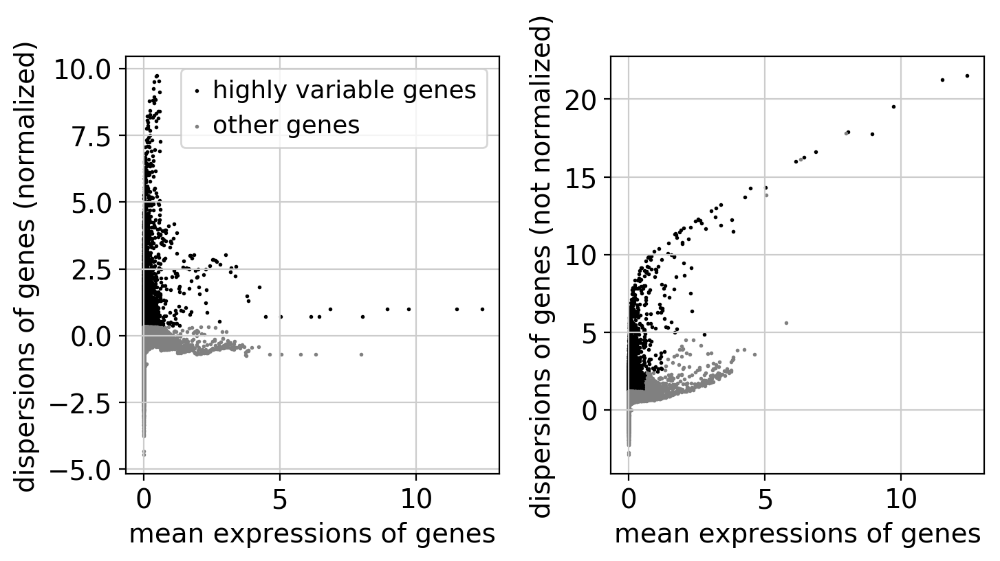

In [23]:
# with set # top genes
sc.pp.highly_variable_genes(adata, n_top_genes=4000)
                            # min_mean=0.0125, max_mean=3, min_disp=0.5)                          
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))
#plot found HVGs:
sc.pl.highly_variable_genes(adata)

adata = adata[:, adata.var.highly_variable]
adata

sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])
sc.pp.scale(adata, max_value=10)

## Visualization

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:06)


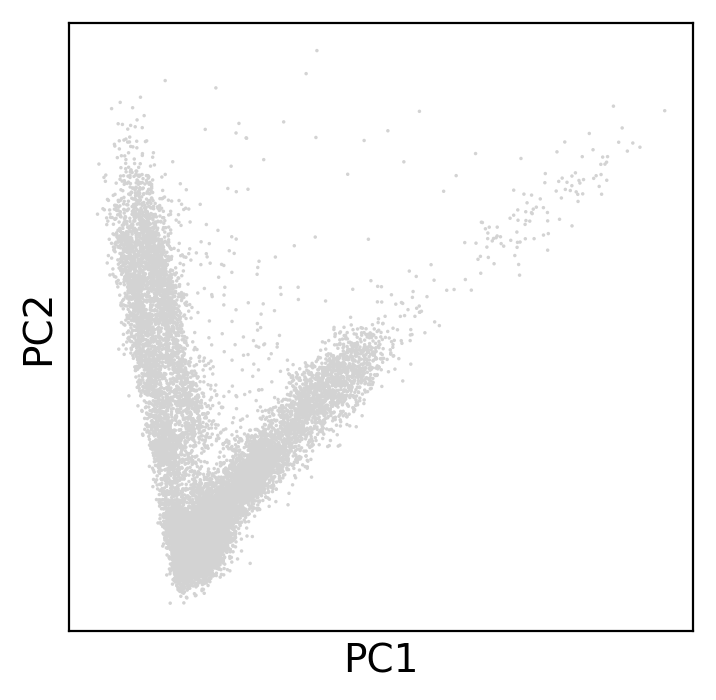

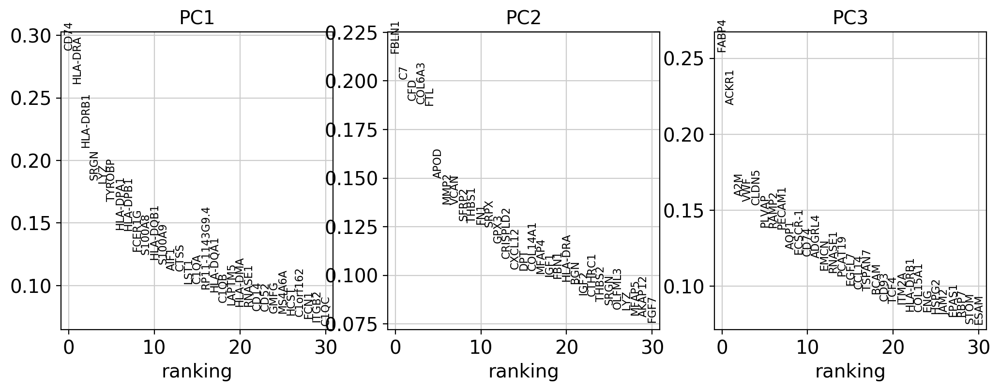

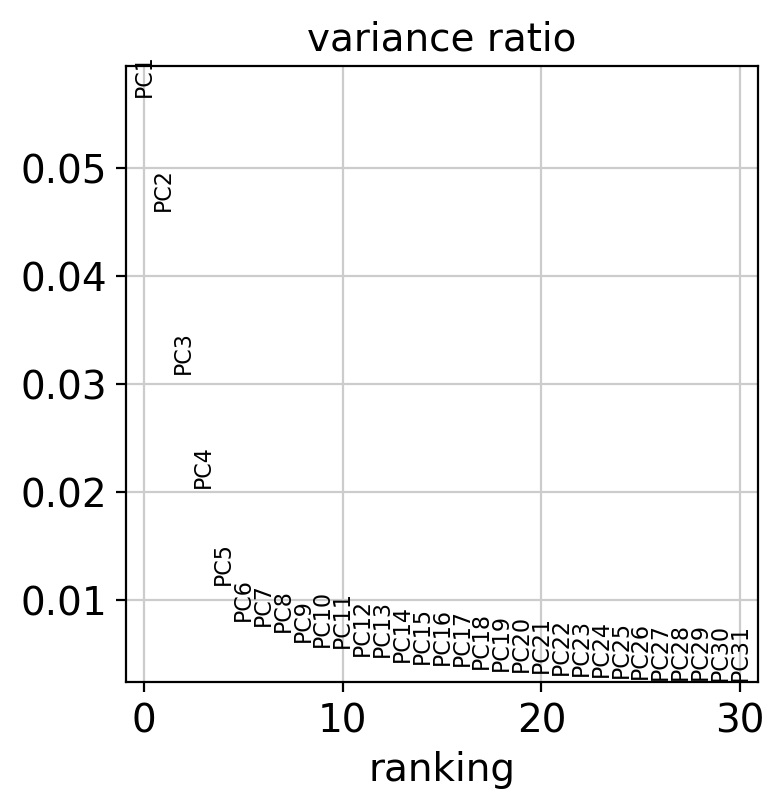

computing neighbors
    using 'X_pca' with n_pcs = 50


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished (0:00:07)


In [36]:
#reduce dimensions with PCA
sc.tl.pca(adata, n_comps= 50, svd_solver='arpack', use_highly_variable=True)
sc.pl.pca_overview(adata)
#compute neighbour graph

sc.pp.neighbors(adata, n_neighbors=20)#, n_pcs=10)

computing UMAP
    finished (0:00:19)


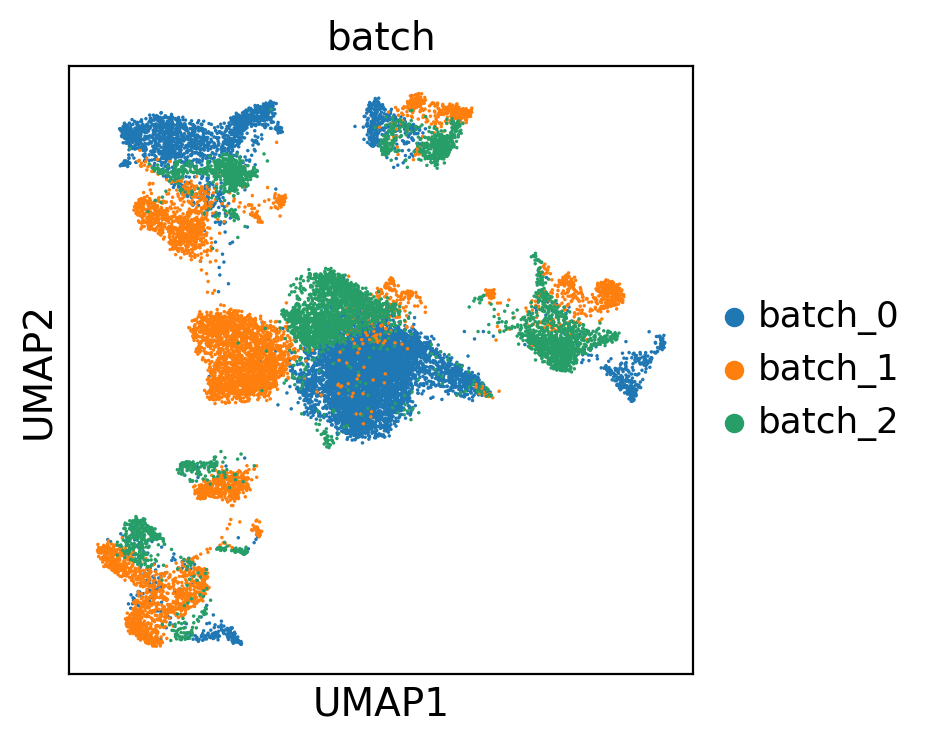

In [37]:
sc.tl.umap(adata)
sc.pl.umap(adata, color=['batch'])
#sc.pl.umap(adata, color=['CX3CL1','CX3CR1'])

## Cluster analysis
Louvain or Leiden

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:02)


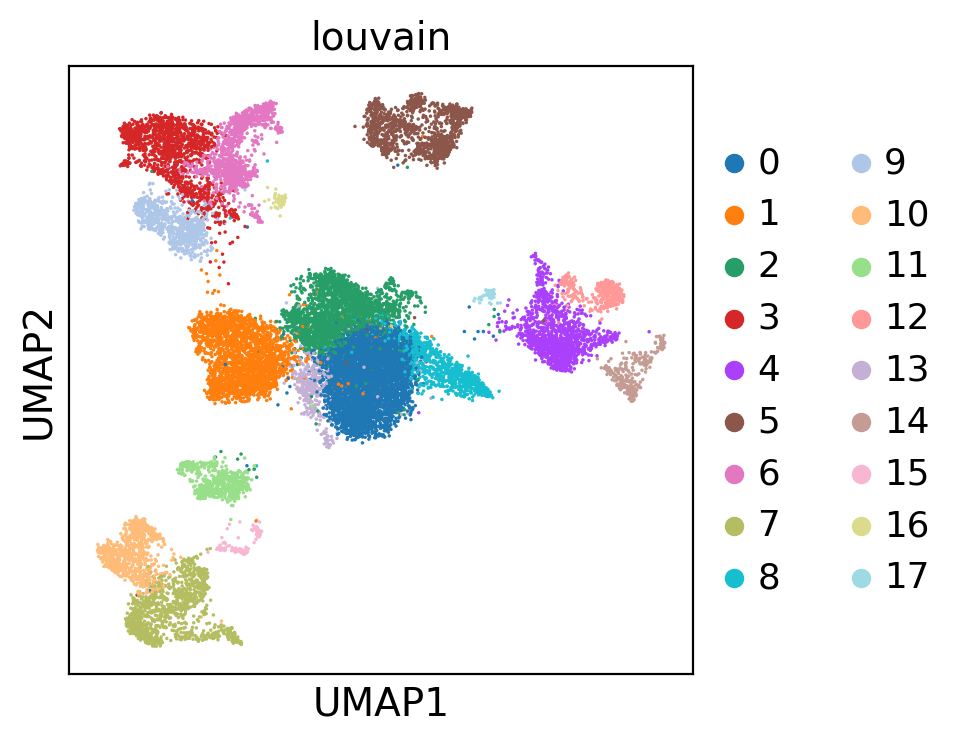

In [38]:
#clustering:
sc.tl.louvain(adata)
sc.pl.umap(adata, color=['louvain'])

### **Cluster annotation**
### find Markergenes
per Cluster to identify Cell identitied per Clusters

**Wilcox rank-sum (Mann-Whitney-U)**

ranking genes
    finished (0:00:44)
peak memory: 8690.53 MiB, increment: 1455.17 MiB


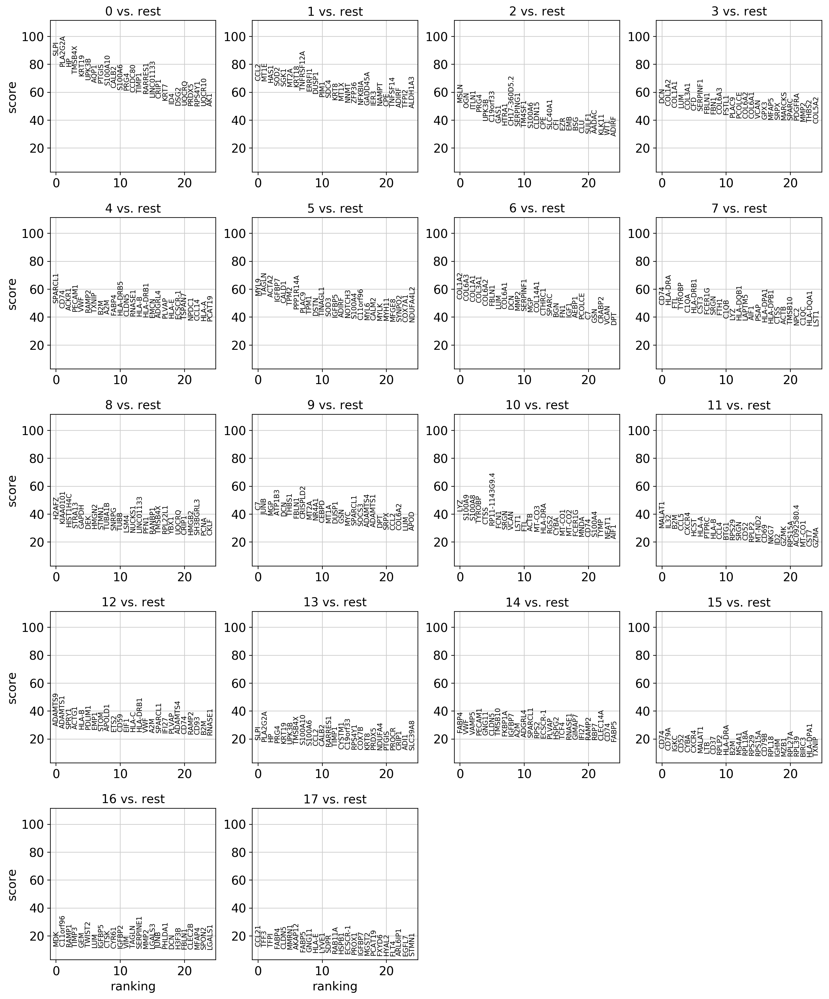

CPU times: user 38.5 s, sys: 18.3 s, total: 56.8 s
Wall time: 48.7 s


In [39]:
%%time
%memit sc.tl.rank_genes_groups(adata, groupby='louvain', method='wilcoxon') 
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=True)

In [40]:
#show top 2 ranked genes per cluster
pd.set_option('display.max_columns', 35)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,SLPI,CCL2,MSLN,DCN,SPARCL1,MYL9,COL1A2,CD74,H2AFZ,C7,LYZ,MALAT1,ADAMTS9,SLPI,FABP4,CD74,MDK,CCL21
1,PLA2G2A,MT1E,OGN,COL1A2,CD74,TAGLN,COL6A3,HLA-DRA,KIAA0101,JUNB,S100A9,IL32,ADAMTS1,PLA2G2A,VWF,CD79A,C11orf96,TFF3
2,HP,HAS1,ITLN1,COL1A1,ACKR1,ACTA2,COL1A1,FTL,HIST1H4C,MGP,S100A8,B2M,SPRY1,HP,VAMP5,IGKC,RAMP1,TFPI
3,TMSB4X,SOD2,PRG4,LUM,PECAM1,IGFBP7,COL3A1,TYROBP,STRA13,ATP1B3,TYROBP,CCL5,ACTG1,PRG4,PECAM1,CD52,TIMP3,FABP4
4,KRT19,SGK1,UPK3B,COL3A1,VWF,CALD1,COL6A2,C1QA,GAPDH,DCN,CTSS,CXCR4,HLA-B,KRT19,GNG11,CYBA,GEM,CLDN5
5,UPK3B,MT2A,C19orf33,CFD,RAMP2,TPM2,FBLN1,HLA-DRB1,DEK,THBS1,RP11-1143G9.4,HCST,PDLIM1,UPK3B,CLDN5,CXCR4,TWIST2,MMRN1
6,AQP1,KRT18,GAS1,SERPINF1,TXNIP,PPP1R14A,LUM,CST3,HMGN2,FBLN1,FCN1,HLA-A,EMP1,TMSB4X,TMSB10,MALAT1,LUM,AKAP12
7,PTGIS,TNFRSF12A,HTRA1,FBLN1,B2M,PLAC9,COL6A1,FCER1G,STMN1,CRISPLD2,SRGN,PTPRC,STOM,S100A10,FKBP1A,LTB,IGFBP5,FABP5
8,S100A10,ERRFI1,CH17-360D5.2,FBN1,A2M,TPM1,DCN,SRGN,TUBA1B,MT2A,VCAN,HLA-B,APOLD1,S100A6,IGFBP7,CD37,CTSK,GNG11
9,CALB2,DUSP1,SERPING1,COL6A3,FABP4,DSTN,MMP2,FTH1,SNRPG,NR4A1,LST1,CCL4,ETS2,CCL2,A2M,RPLP2,CYR61,HLA-E


In [41]:
#list of markergenes 
marker_genes=["CD3D","CD3E","NKG7", # t
              "KRT5","UPK3B","PDPN", # mesothelia
              "CD14", "S100A8",      # mononucl
              "PDGFRB", "ACTA2",     # myrofibroblast
              "MMP2", "SFRP2",       # firbroblast
              "PECAM1", "VWF",       # endothelia
              "MS4A1"]               # B  "IGHD", 
marker_genes_dict={"T-Cell":["CD3D","CD3E","NKG7"], # t
                  "Mesothelial":["KRT5","UPK3B","PDPN"], # mesothelia
                  "Mononuclear":["CD14", "S100A8"],      # mononucl
                  "Myofibroblast":["PDGFRB", "ACTA2"],     # myrofibroblast
                  "Fibroblast":["MMP2", "SFRP2"],       # firbroblast
                  "Endothelial":["PECAM1", "VWF"],       # endothelia
                  "B-Cell":["MS4A1"]}      # B  "IGHD", 

### see which cluster has how many markers in ranked genes:

In [42]:
cell_annotation = sc.tl.marker_gene_overlap(adata, marker_genes_dict)
cell_annotation

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
T-Cell,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
Mesothelial,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
Mononuclear,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Myofibroblast,0.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Fibroblast,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
Endothelial,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0
B-Cell,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


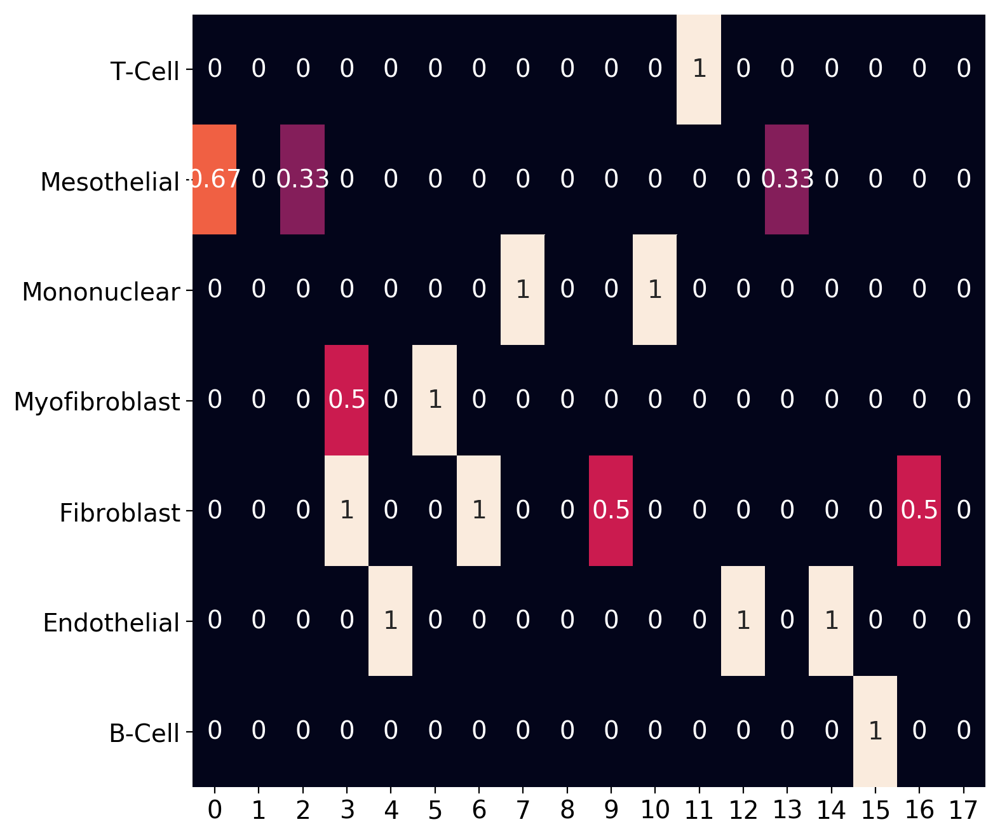

In [43]:
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, marker_genes_dict, normalize='reference')
fig, ax = plt.subplots(figsize=(8,8))
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)

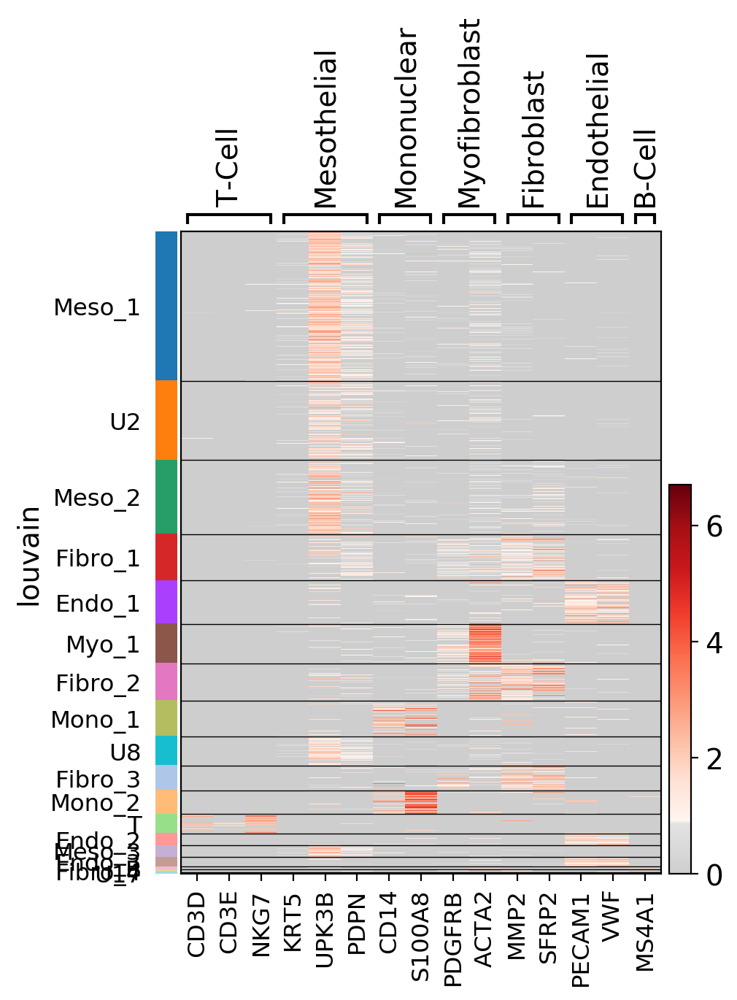

In [107]:
ax = sc.pl.heatmap(adata, marker_genes_dict, groupby='louvain', show_gene_labels=True, cmap=mymap),
                #    swap_axes=False)

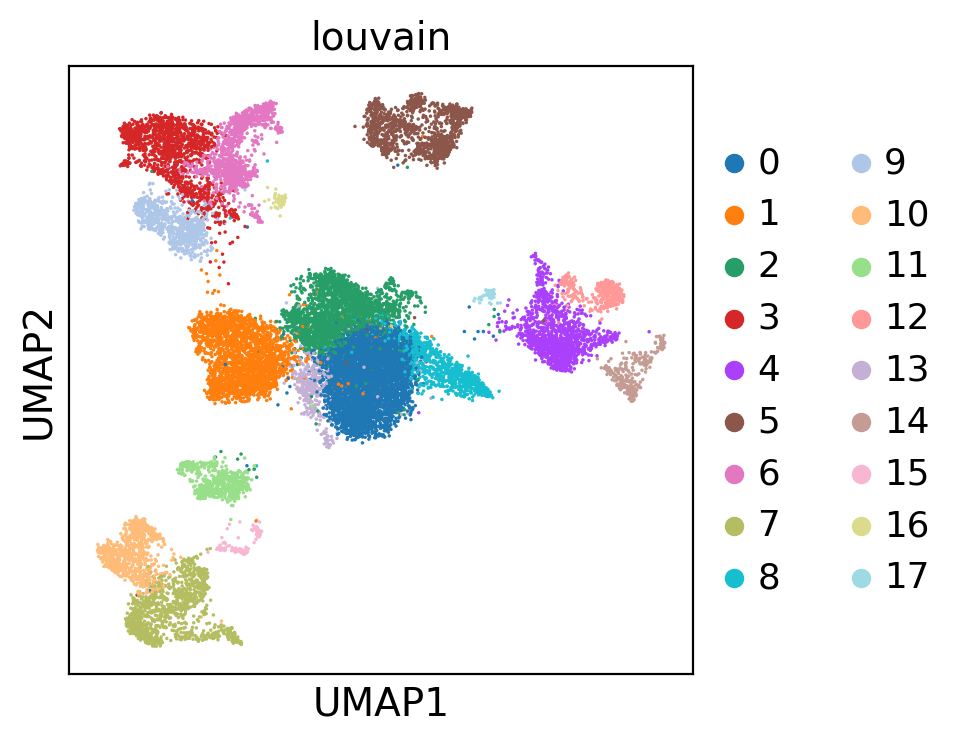

In [45]:
#visualize clusters:
sc.pl.umap(adata, color=['louvain'])

In [46]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

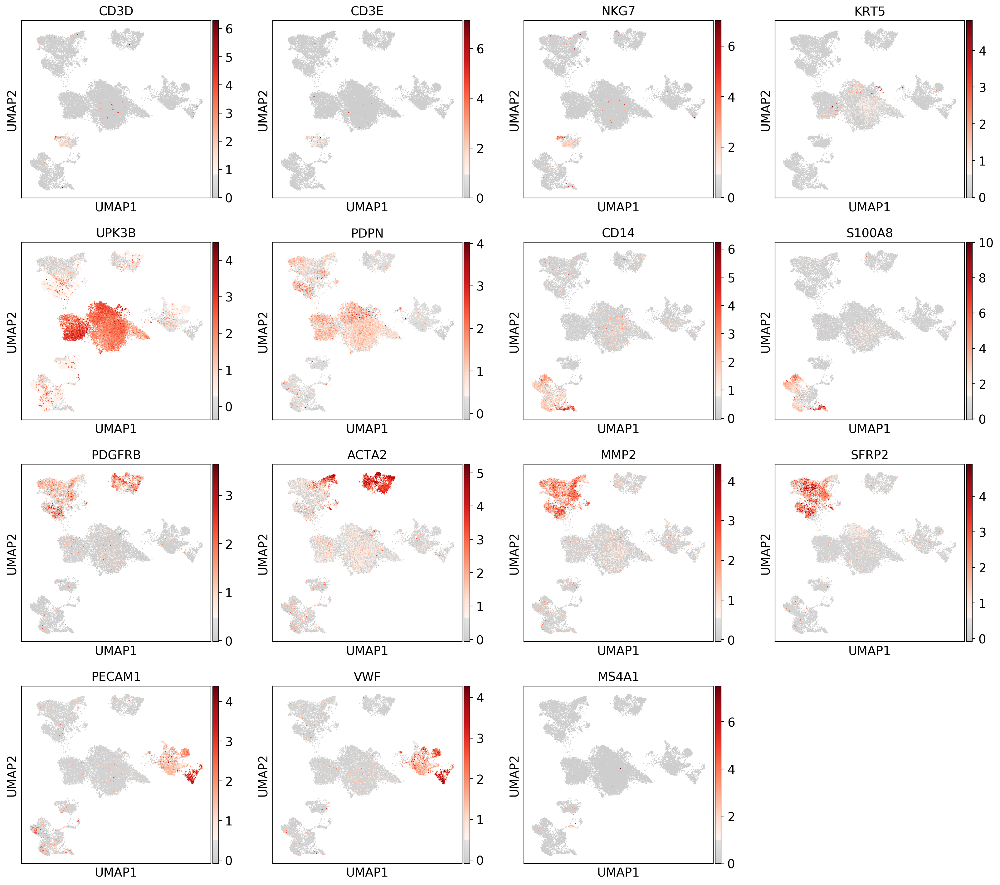

In [47]:
#color by marker
sc.pl.umap(adata, color=marker_genes, use_raw=False, color_map=mymap)

sc.pl.violin(adata, groupby='louvain', keys="PECAM1", use_raw=False)

### rename clusters with cell identities

In [48]:
#Categories to rename
adata.obs['louvain'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17'],
      dtype='object')

**rename clusters based on cell_annotation_norm and heatmap**

In [50]:
adata.rename_categories('louvain', ['Meso_1', 'U2', 'Meso_2', 'Fibro_1', 'Endo_1', 'Myo_1', 
                                    'Fibro_2', 'Mono_1', 'U8', 'Fibro_3', 'Mono_2', 'T',
                                    'Endo_2', 'Meso_3', 'Endo_3', 'B', 'Fibro_4', 'U17'])
adata.obs['louvain'].value_counts()

Meso_1     4434
U2         2339
Meso_2     2191
Fibro_1    1373
Endo_1     1279
Myo_1      1178
Fibro_2    1099
Mono_1     1054
U8          870
Fibro_3     736
Mono_2      704
T           568
Endo_2      351
Meso_3      349
Endo_3      275
B           100
Fibro_4      66
U17          60
Name: louvain, dtype: int64

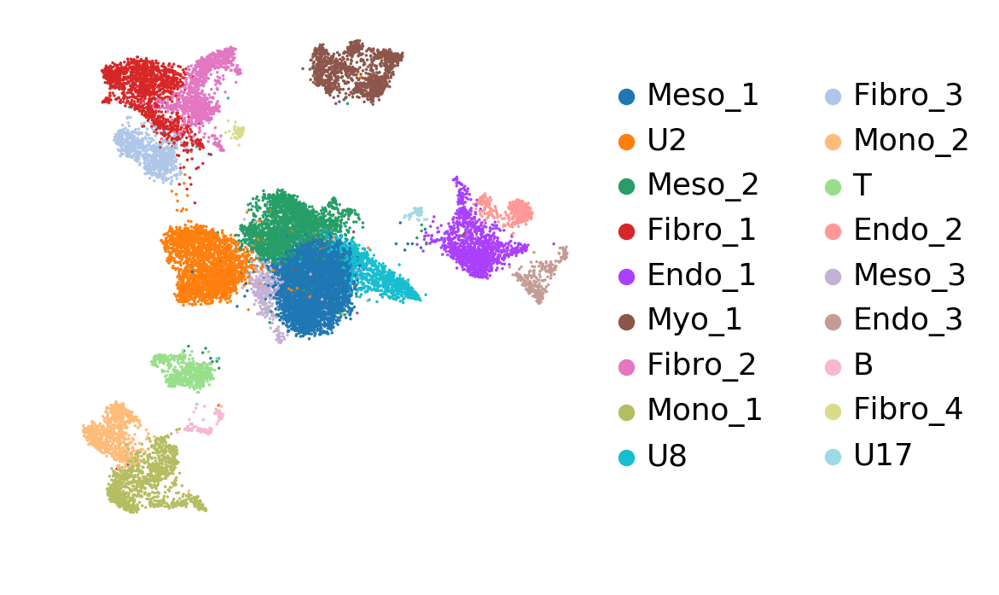

In [53]:
#sc.pl.umap(adata, color='louvain', legend_loc='on data', title='', frameon=False)
sc.pl.umap(adata, color='louvain', title='', frameon=False)

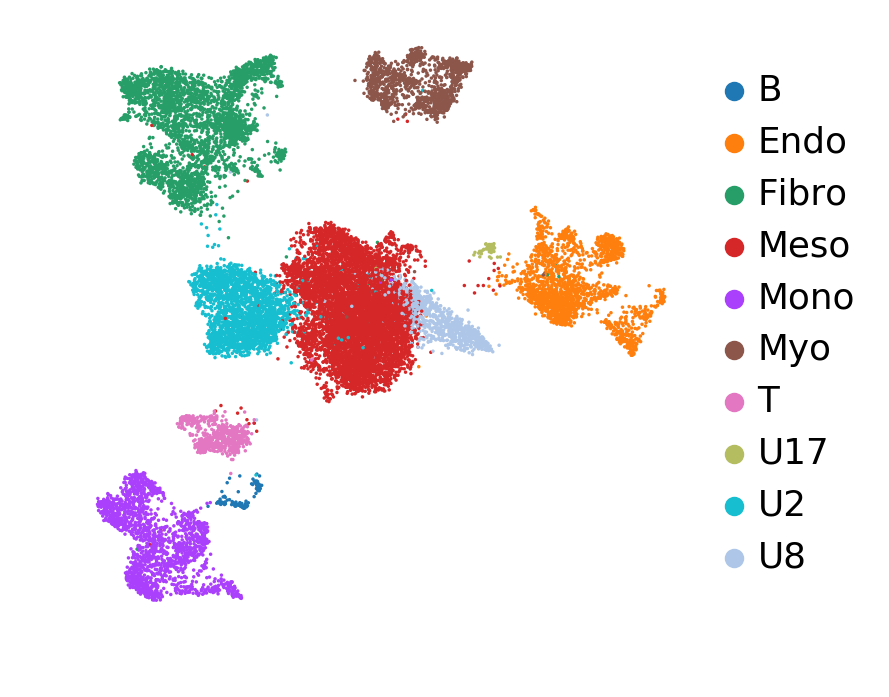

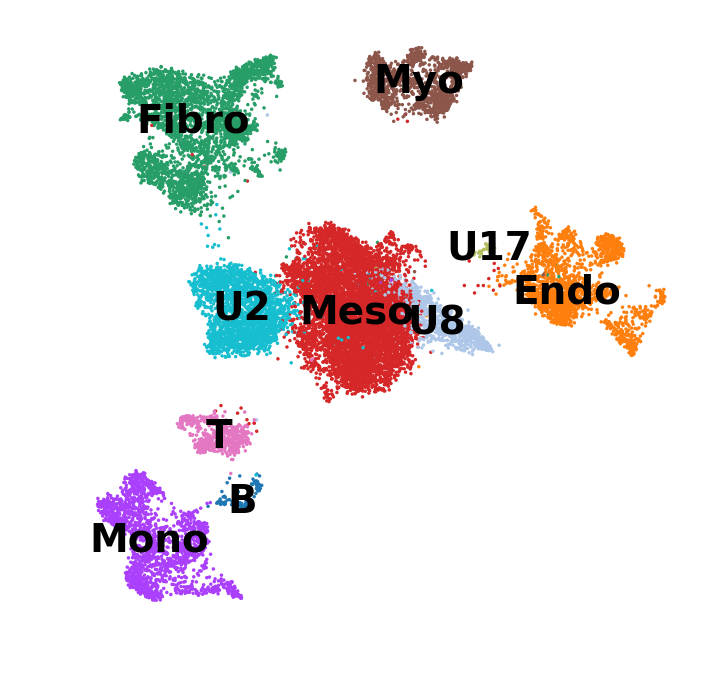

In [54]:
old_to_new = dict(Meso_1="Meso", U2="U2", Meso_2="Meso", Fibro_1="Fibro", Endo_1="Endo", 
                  Myo_1="Myo", Fibro_2="Fibro", Mono_1="Mono", U8="U8", Fibro_3="Fibro",
                  Mono_2="Mono", T="T", Endo_2="Endo", Meso_3="Meso", Endo_3="Endo", B="B", 
                  Fibro_4="Fibro", U17="U17")

adata.obs['new_clusters'] = (adata.obs['louvain'].map(old_to_new).astype('category'))
sc.pl.umap(adata, color='new_clusters', title='', frameon=False)
sc.pl.umap(adata, color='new_clusters', title='',  legend_loc='on data', frameon=False)

U2 is also meso? MSLN 

adata.write(results_file)

adata = sc.read(results_file)

In [55]:
print("#Cells: ",adata.shape[0])
print("#T-Cells: ",adata[adata.obs["new_clusters"]=="T"].shape[0], "(",adata[adata.obs["new_clusters"]=="T"].shape[0]/adata.shape[0]*100,"%)")
print("#Mesothelial-Cells: ",adata[adata.obs["new_clusters"]=="Meso"].shape[0], " (",adata[adata.obs["new_clusters"]=="Meso"].shape[0]/adata.shape[0]*100,"%)")
print("#B-Cells: ",adata[adata.obs["new_clusters"]=="B"].shape[0], " (",adata[adata.obs["new_clusters"]=="B"].shape[0]/adata.shape[0]*100,"%)")
print("#Myofibroblast-Cells: ",adata[adata.obs["new_clusters"]=="Myo"].shape[0], " (",adata[adata.obs["new_clusters"]=="Myo"].shape[0]/adata.shape[0]*100,"%)")
print("#Endothelial-Cells: ",adata[adata.obs["new_clusters"]=="Endo"].shape[0], " (",adata[adata.obs["new_clusters"]=="Endo"].shape[0]/adata.shape[0]*100,"%)")
print("#Mononuclear-Cells: ",adata[adata.obs["new_clusters"]=="Mono"].shape[0], " (",adata[adata.obs["new_clusters"]=="Mono"].shape[0]/adata.shape[0]*100,"%)")
print("#Fibrobalst-Cells: ",adata[adata.obs["new_clusters"]=="Fibro"].shape[0], " (",adata[adata.obs["new_clusters"]=="Fibro"].shape[0]/adata.shape[0]*100,"%)")
#print("#Unknown Cells: ",adata[adata.obs["new_clusters"]== " "].shape[0])

#Cells:  19026
#T-Cells:  568 ( 2.985388415851992 %)
#Mesothelial-Cells:  6974  ( 36.65510354252076 %)
#B-Cells:  100  ( 0.5255965520866183 %)
#Myofibroblast-Cells:  1178  ( 6.191527383580364 %)
#Endothelial-Cells:  1905  ( 10.01261431725008 %)
#Mononuclear-Cells:  1758  ( 9.23998738568275 %)
#Fibrobalst-Cells:  3274  ( 17.208031115315883 %)


In [125]:
nr_batch=len(np.unique(adata.obs["batch"]))
print("normalized for number of samples:")
print("#Cells: ",adata.shape[0]/nr_batch)
print("#T-Cells: ",adata[adata.obs["new_clusters"]=="T"].shape[0]/nr_batch,
      "(",(adata[adata.obs["new_clusters"]=="T"].shape[0])/(adata.shape[0])*100,"%)")
print("#Mesothelial-Cells: ",adata[adata.obs["new_clusters"]=="Meso"].shape[0]/nr_batch,
      " (",(adata[adata.obs["new_clusters"]=="Meso"].shape[0])/(adata.shape[0])*100,"%)")
print("#B-Cells: ",adata[adata.obs["new_clusters"]=="B"].shape[0]/nr_batch, 
      " (",(adata[adata.obs["new_clusters"]=="B"].shape[0])/(adata.shape[0])*100,"%)")
print("#Myofibroblast-Cells: ",adata[adata.obs["new_clusters"]=="Myo"].shape[0]/nr_batch,
      " (",adata[adata.obs["new_clusters"]=="Myo"].shape[0]/(adata.shape[0])*100,"%)")
print("#Endothelial-Cells: ",adata[adata.obs["new_clusters"]=="Endo"].shape[0]/nr_batch, 
      " (",adata[adata.obs["new_clusters"]=="Endo"].shape[0]/(adata.shape[0])*100,"%)")
print("#Mononuclear-Cells: ",adata[adata.obs["new_clusters"]=="Mono"].shape[0]/nr_batch,
      " (",adata[adata.obs["new_clusters"]=="Mono"].shape[0]/(adata.shape[0])*100,"%)")
print("#Fibrobalst-Cells: ",adata[adata.obs["new_clusters"]=="Fibro"].shape[0]/nr_batch,
      " (",adata[adata.obs["new_clusters"]=="Fibro"].shape[0]/(adata.shape[0])*100,"%)")
#print("#Unknown Cells: ",adata[adata.obs["new_clusters"]== " "].shape[0])

normalized for number of samples:
#Cells:  6342.0
#T-Cells:  189.33333333333334 ( 2.985388415851992 %)
#Mesothelial-Cells:  2324.6666666666665  ( 36.65510354252076 %)
#B-Cells:  33.333333333333336  ( 0.5255965520866183 %)
#Myofibroblast-Cells:  392.6666666666667  ( 6.191527383580364 %)
#Endothelial-Cells:  635.0  ( 10.01261431725008 %)
#Mononuclear-Cells:  586.0  ( 9.23998738568275 %)
#Fibrobalst-Cells:  1091.3333333333333  ( 17.208031115315883 %)


## subclustering T-cell:

In [69]:
sc.tl.louvain(adata, restrict_to=('new_clusters', ['T']), resolution=0.5,
              key_added='louvain_T_sub')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)


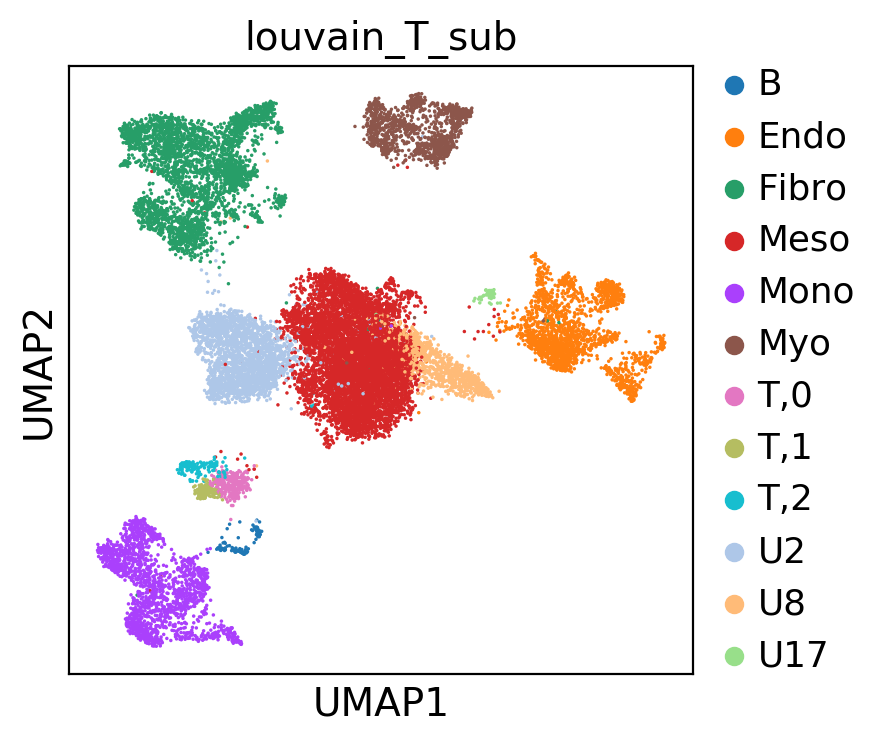

In [70]:
#Show the new clustering:
if 'louvain_T_sub_colors' in adata.uns:
    del adata.uns['louvain_T_sub_colors']

sc.pl.umap(adata, color='louvain_T_sub')

ax = sc.pl.heatmap(adata[adata.obs["new_clusters"]=="T"], marker_genes_T["T-cells"], groupby="louvain_T_sub", 
                   show_gene_labels=True, figsize =(8,12), cmap=mymap)     

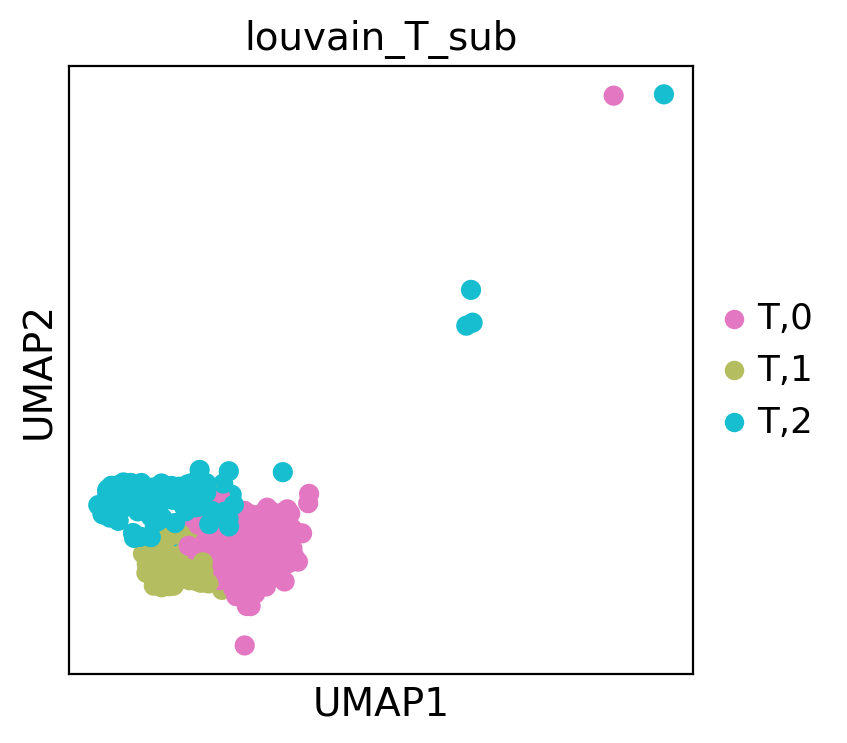

In [71]:
sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color='louvain_T_sub')

In [72]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_T_sub', key_added='rank_genes_T_sub')

ranking genes
    finished (0:00:12)


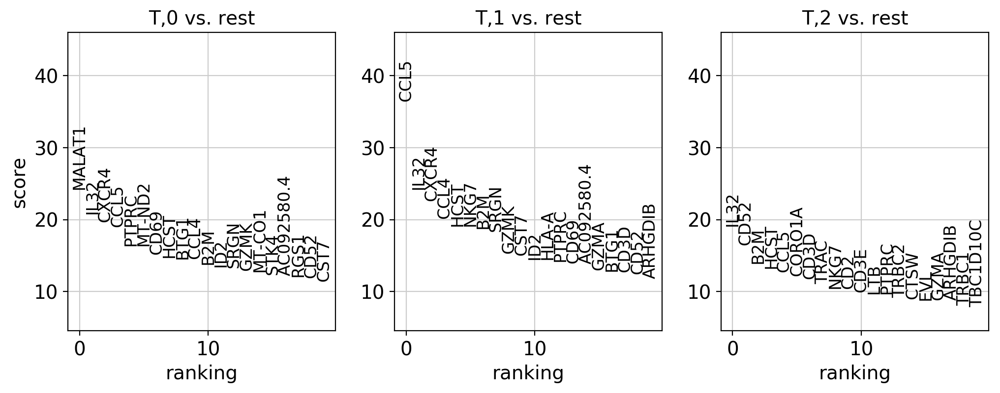

In [73]:
#Plot the new marker genes
T_clusters = [i for i in np.unique(adata.obs["louvain_T_sub"]) if "T" in i] 
sc.pl.rank_genes_groups(adata, key='rank_genes_T_sub', groups=T_clusters, fontsize=12)

**test if subclusters are based on real differences or only noise**:  
plot rank_genes 90-100

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


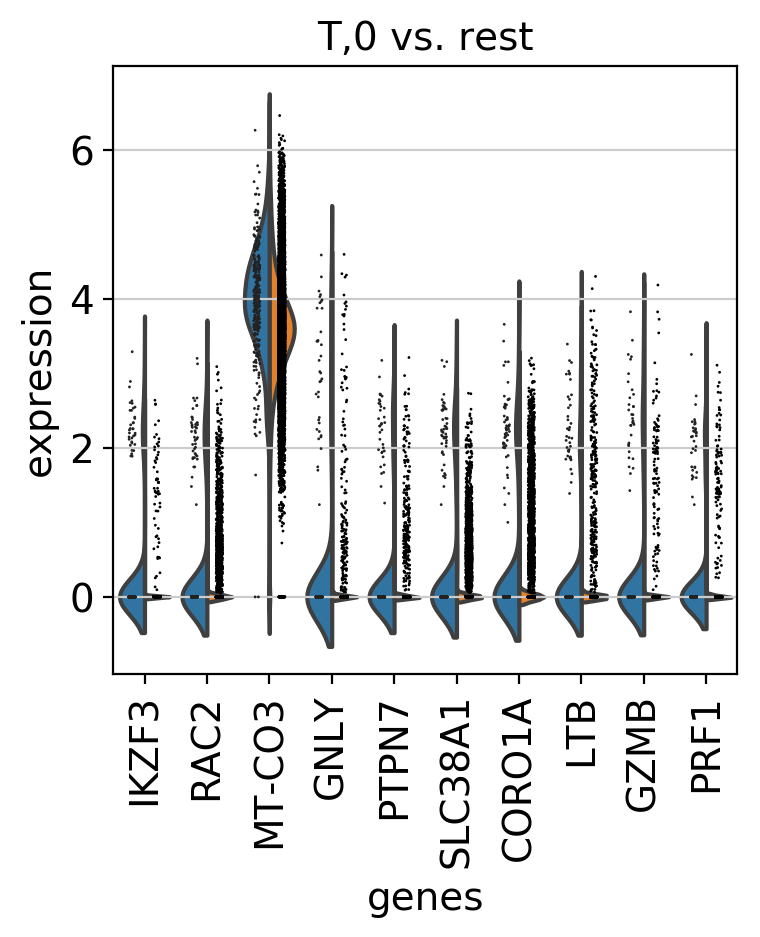

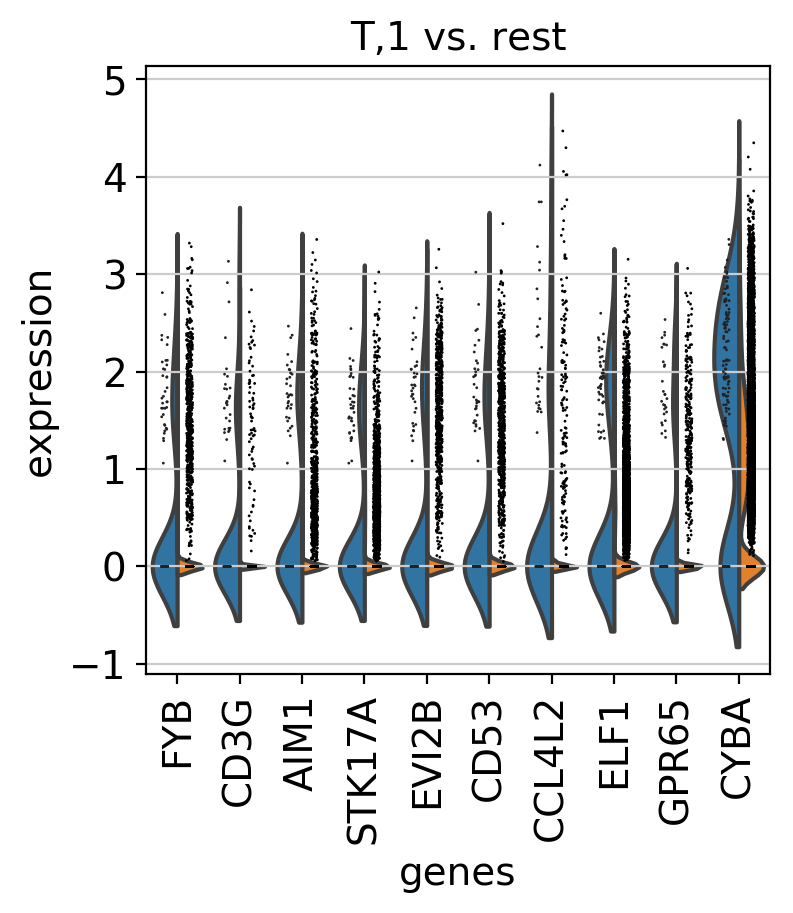

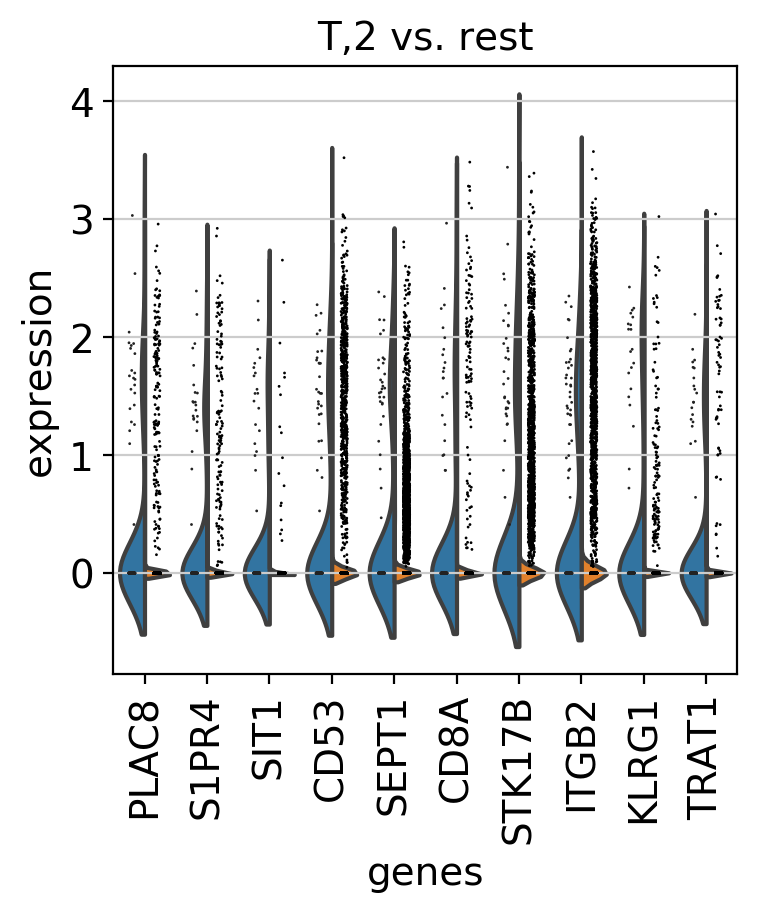

In [74]:
T_clusts = [clust for clust in adata.obs['louvain_T_sub'].cat.categories if clust.startswith('T')]

for clust in T_clusts:
    sc.pl.rank_genes_groups_violin(adata, use_raw=True, key='rank_genes_T_sub', 
                                   groups=[clust], 
                                   gene_names=adata.uns['rank_genes_T_sub']['names'][clust][90:100])

In [75]:
marker_genes_T = {"T-cells":["CD3D","CD3E","NKG7","IL23R","NFAT5",
                             "SGK1","HIF1A","IFNG","IL6","IL10", "CD4","TBX21","GATA3","RORC"]} 
                #"TNFA", "IL17A","IL17F","IL21","IL22","FOXP3"
#marker_genes_dict_T = {k: marker_genes_dict[k] for k in marker_genes_dict if k.startswith('T')}

#Find marker overlap
sc.tl.marker_gene_overlap(adata, marker_genes_T, key='rank_genes_T_sub', normalize='reference')

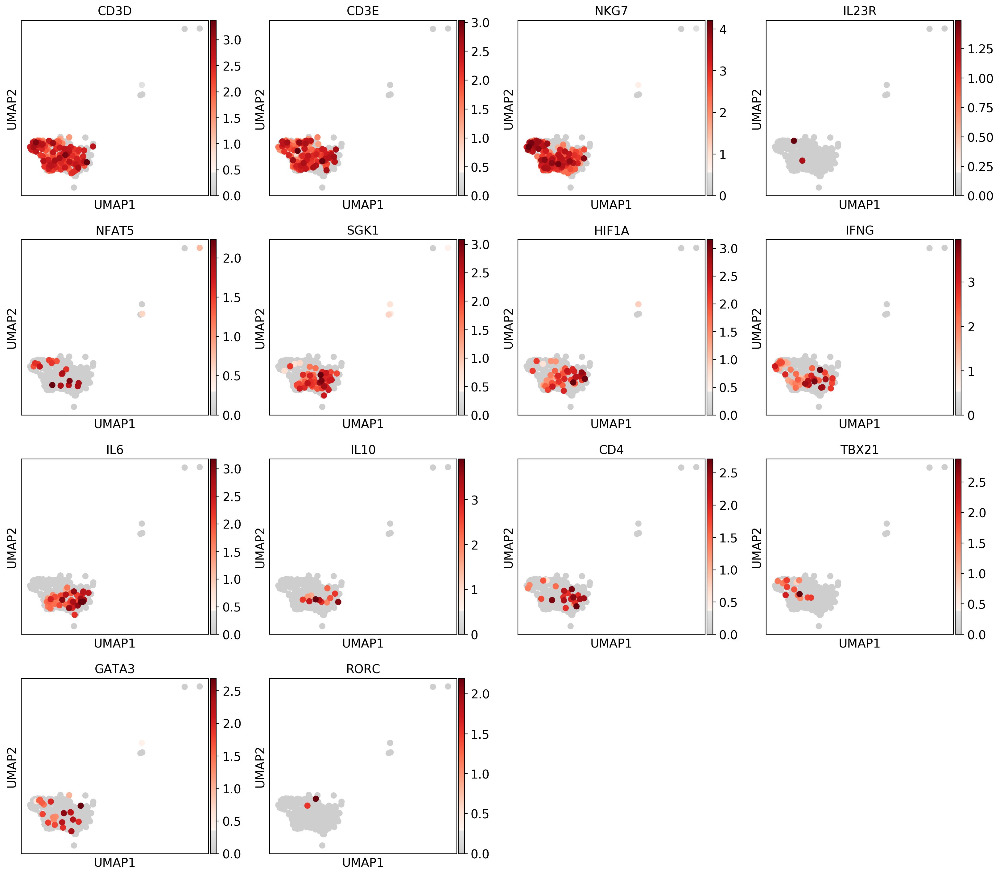

In [76]:
sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color=marker_genes_T["T-cells"],
           title=marker_genes_T["T-cells"], color_map=mymap)
#sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color='louvain_T_sub')

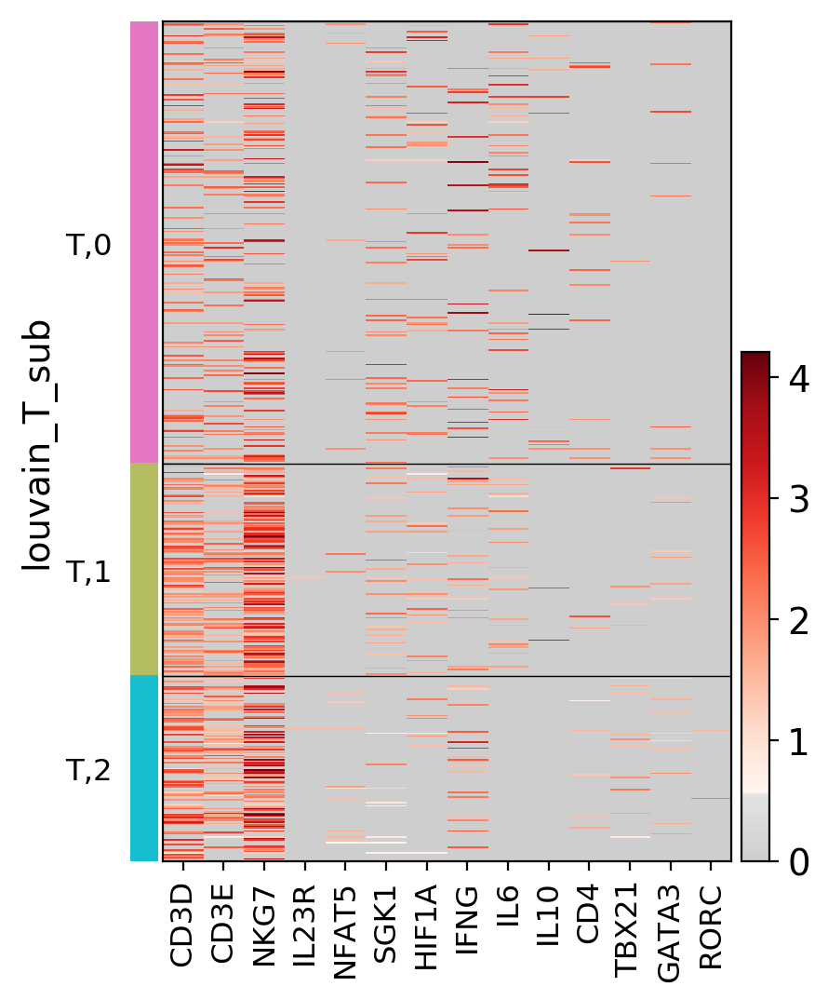

In [95]:
ax = sc.pl.heatmap(adata[adata.obs["new_clusters"]=="T"], marker_genes_T["T-cells"], groupby="louvain_T_sub", 
                   show_gene_labels=True, cmap=mymap)     

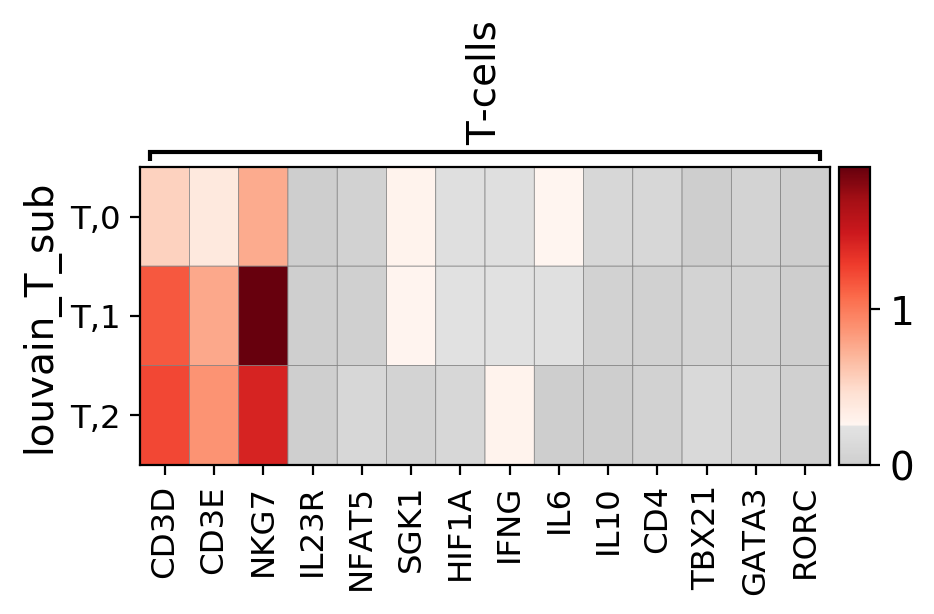

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[4.48, 0, 0.2])

In [78]:
#Matrixplot
sc.pl.matrixplot(adata[adata.obs["new_clusters"]=="T"], marker_genes_T, groupby='louvain_T_sub', cmap=mymap)

In [68]:
import matplotlib.pyplot as plt
print("#T-Cells: ", len(adata[adata.obs["new_clusters"]=="T"]))
# use raw data _> only normlaized and log tranformed: zero vlaue is still zero!
for m in marker_genes_T["T-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="T"].raw[: , m].X > 0)
    print("#",m, " expressing cells: ",number, " (",round(number/len(adata[adata.obs["new_clusters"]=="T"])*100, 2),"%)", sep='')

#T-Cells:  568
#CD3D expressing cells: 228 (40.14%)
#CD3E expressing cells: 175 (30.81%)
#NKG7 expressing cells: 271 (47.71%)
#IL23R expressing cells: 2 (0.35%)
#NFAT5 expressing cells: 19 (3.35%)
#SGK1 expressing cells: 69 (12.15%)
#HIF1A expressing cells: 56 (9.86%)
#IFNG expressing cells: 55 (9.68%)
#IL6 expressing cells: 53 (9.33%)
#IL10 expressing cells: 14 (2.46%)
#CD4 expressing cells: 22 (3.87%)
#TBX21 expressing cells: 15 (2.64%)
#GATA3 expressing cells: 23 (4.05%)
#RORC expressing cells: 2 (0.35%)


In [121]:
import matplotlib.pyplot as plt
nr_batch=len(np.unique(adata.obs["batch"]))
print("normalized for number of samples:")
print("#T-Cells: ", len(adata[adata.obs["new_clusters"]=="T"])/nr_batch)
# use raw data _> only normlaized and log tranformed: zero vlaue is still zero!
for m in marker_genes_T["T-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="T"].raw[: , m].X > 0)/nr_batch
    print("#",m, " expressing cells: ",number,
          " (",round(number/(len(adata[adata.obs["new_clusters"]=="T"])/nr_batch)*100, 2),"%)", sep='')

normalized for number of samples:
#T-Cells:  189.33333333333334
#CD3D expressing cells: 76.0 (40.14%)
#CD3E expressing cells: 58.333333333333336 (30.81%)
#NKG7 expressing cells: 90.33333333333333 (47.71%)
#IL23R expressing cells: 0.6666666666666666 (0.35%)
#NFAT5 expressing cells: 6.333333333333333 (3.35%)
#SGK1 expressing cells: 23.0 (12.15%)
#HIF1A expressing cells: 18.666666666666668 (9.86%)
#IFNG expressing cells: 18.333333333333332 (9.68%)
#IL6 expressing cells: 17.666666666666668 (9.33%)
#IL10 expressing cells: 4.666666666666667 (2.46%)
#CD4 expressing cells: 7.333333333333333 (3.87%)
#TBX21 expressing cells: 5.0 (2.64%)
#GATA3 expressing cells: 7.666666666666667 (4.05%)
#RORC expressing cells: 0.6666666666666666 (0.35%)


In [33]:
import matplotlib.pyplot as plt
print("Expressionslevel:")
# use raw data _> only normlaized and log tranformed: zero vlaue is still zero!
for m in ["NFAT5","SGK1","HIF1A"]:
    print(m)
    l = list(adata[adata.obs["new_clusters"]=="T"].raw[: , m].X) 
    l = list(filter(lambda num: num != 0, l))
    arr = np.array(l)
    print("Mean: ",np.mean(arr, axis=0))
    print("Std: ",np.std(arr, axis=0))

Expressionslevel:
NFAT5
Mean:  1.6165493222973224
Std:  0.40155110137684197
SGK1
Mean:  1.8941345153936866
Std:  0.5610816577295282
HIF1A
Mean:  1.9092200408249203
Std:  0.5456294068259483


In [126]:
print("#T-Cells: ", np.unique(adata[adata.obs["new_clusters"]=="T"].obs["batch"], return_counts=True))
for b in np.unique(adata.obs["batch"]):
    print(b)
    for m in marker_genes_T["T-cells"]:
        number = sum(adata[(adata.obs["new_clusters"]=="T") & (adata.obs["batch"]==b)].raw[: , m].X > 0)
        print("#",m, " expressing cells: ",number,
              " (",round(number/(len(adata[(adata.obs["new_clusters"]=="T") & (adata.obs["batch"]==b)]))*100, 2),"%)", sep='')

#T-Cells:  (array(['batch_0', 'batch_1', 'batch_2'], dtype=object), array([ 13, 431, 124]))
batch_0
#CD3D expressing cells: 3 (23.08%)
#CD3E expressing cells: 4 (30.77%)
#NKG7 expressing cells: 5 (38.46%)
#IL23R expressing cells: 0 (0.0%)
#NFAT5 expressing cells: 3 (23.08%)
#SGK1 expressing cells: 7 (53.85%)
#HIF1A expressing cells: 3 (23.08%)
#IFNG expressing cells: 0 (0.0%)
#IL6 expressing cells: 0 (0.0%)
#IL10 expressing cells: 0 (0.0%)
#CD4 expressing cells: 0 (0.0%)
#TBX21 expressing cells: 1 (7.69%)
#GATA3 expressing cells: 1 (7.69%)
#RORC expressing cells: 0 (0.0%)
batch_1
#CD3D expressing cells: 155 (35.96%)
#CD3E expressing cells: 112 (25.99%)
#NKG7 expressing cells: 203 (47.1%)
#IL23R expressing cells: 1 (0.23%)
#NFAT5 expressing cells: 9 (2.09%)
#SGK1 expressing cells: 60 (13.92%)
#HIF1A expressing cells: 47 (10.9%)
#IFNG expressing cells: 37 (8.58%)
#IL6 expressing cells: 53 (12.3%)
#IL10 expressing cells: 14 (3.25%)
#CD4 expressing cells: 17 (3.94%)
#TBX21 expressing cells

-> subclusters not really reliable since so few cells... 

### CD4 positive Cells Subclustering

In [79]:
adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)]

View of AnnData object with n_obs × n_vars = 22 × 21772 
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'batch_colors', 'louvain', 'louvain_colors', 'rank_genes_groups', 'new_clusters_colors', 'rank_genes_T_sub', 'louvain_T_sub_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

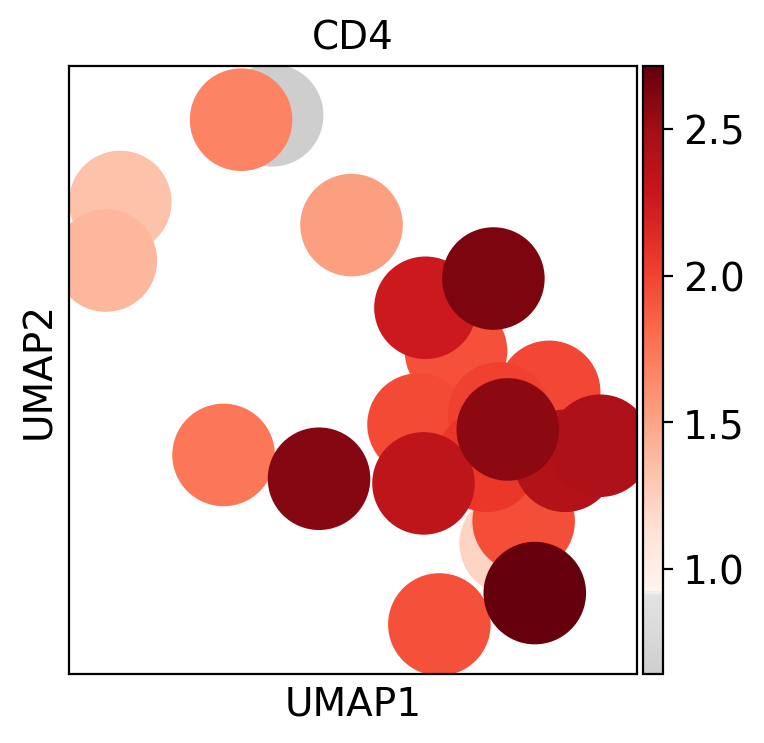

In [88]:
sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)],
                 color="CD4", color_map=mymap)
#sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)], color='louvain_T_sub', color_map=mymap)

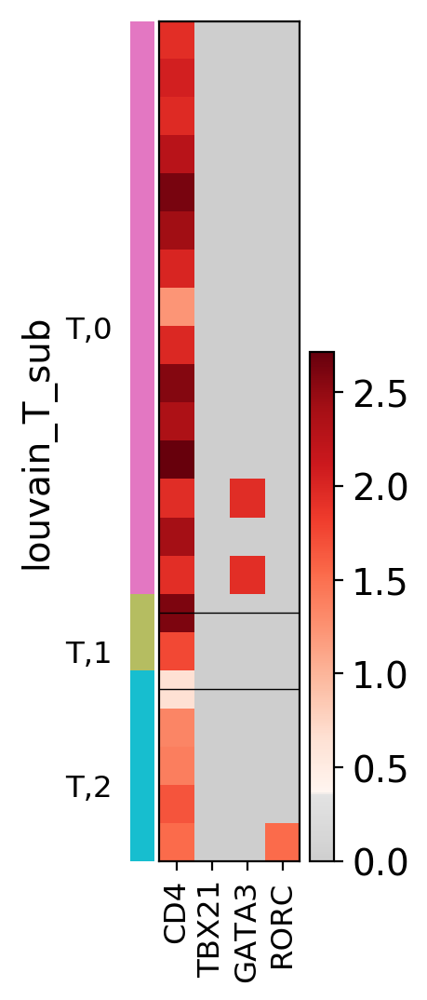

In [84]:
marker_genes_T4 = ["CD4","TBX21","GATA3","RORC"] #"CD3D","CD3E","NKG7","FOXP3",
ax = sc.pl.heatmap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)], 
                   marker_genes_T4, groupby="louvain_T_sub", show_gene_labels=True, cmap=mymap)     

#Matrixplot
sc.pl.matrixplot(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)], 
                 marker_genes_T4, groupby='louvain_T_sub')

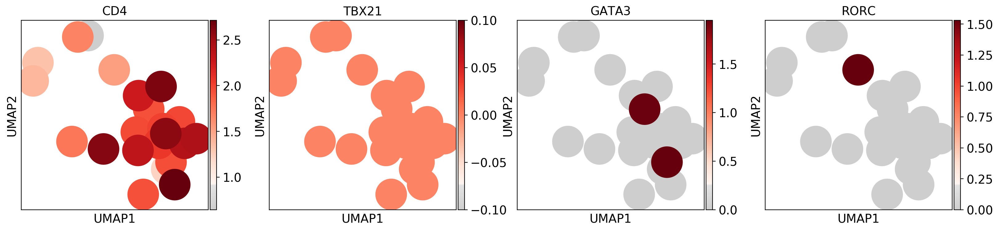

In [85]:
sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)], 
           color=marker_genes_T4,  color_map=mymap)

### RORC postivie Cells

In [86]:
adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)]

View of AnnData object with n_obs × n_vars = 2 × 21772 
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'batch_colors', 'louvain', 'louvain_colors', 'rank_genes_groups', 'new_clusters_colors', 'rank_genes_T_sub', 'louvain_T_sub_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)], 
                 color="CD4", color_map=mymap)
#sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)],color='louvain_T_sub', color_map=mymap)

marker_genes_TR = ["RORC","IL17RA","NFAT5","SGK1",'SLC6A9','SLC6A17', 'SLC6A11', 'SLC6A6', 'SLC6A20',
                   'SLC6A3', 'SLC6A7', 'SLC6A8', 'SLC6A12', 'SLC6A13', 'SLC6A4', 'SLC6A16',"HIF1A",]
ax = sc.pl.heatmap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)], 
                   marker_genes_TR, groupby="louvain", show_gene_labels=True, figsize =(8,12), 
                  cmap=mymap)     

sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)],
           color=marker_genes_TR, color_map=mymap)

## Mesothelial Cells

In [93]:
sc.tl.louvain(adata, restrict_to=('new_clusters', ['Meso']), resolution=0.4,
              key_added='louvain_Meso_sub')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)


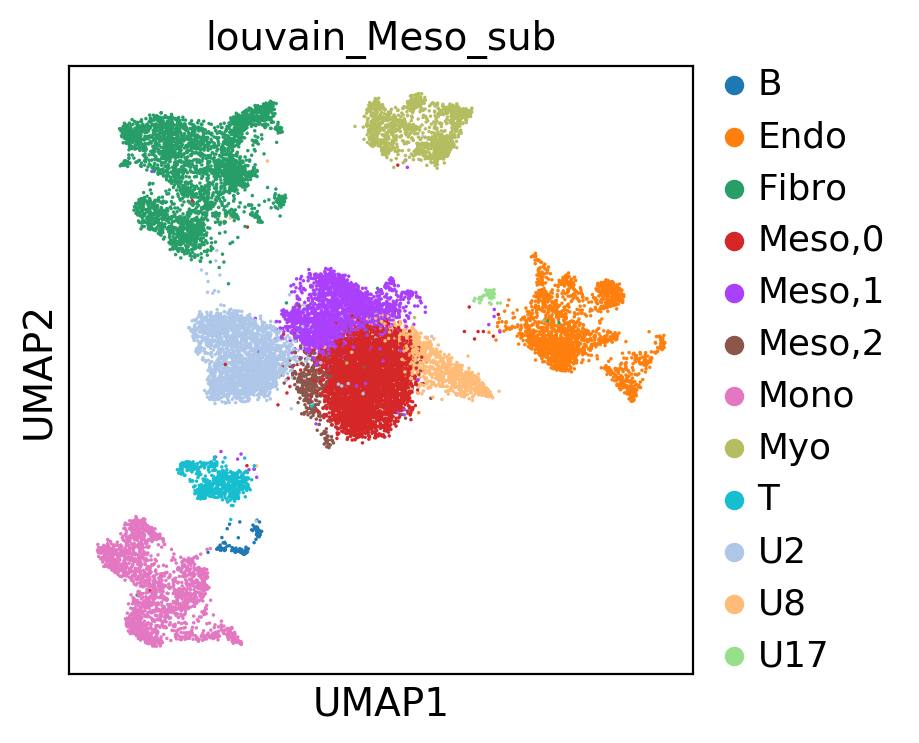

In [94]:
#Show the new clustering:
if 'louvain_Meso_sub_colors' in adata.uns:
    del adata.uns['louvain_Meso_sub_colors']

sc.pl.umap(adata, color='louvain_Meso_sub')

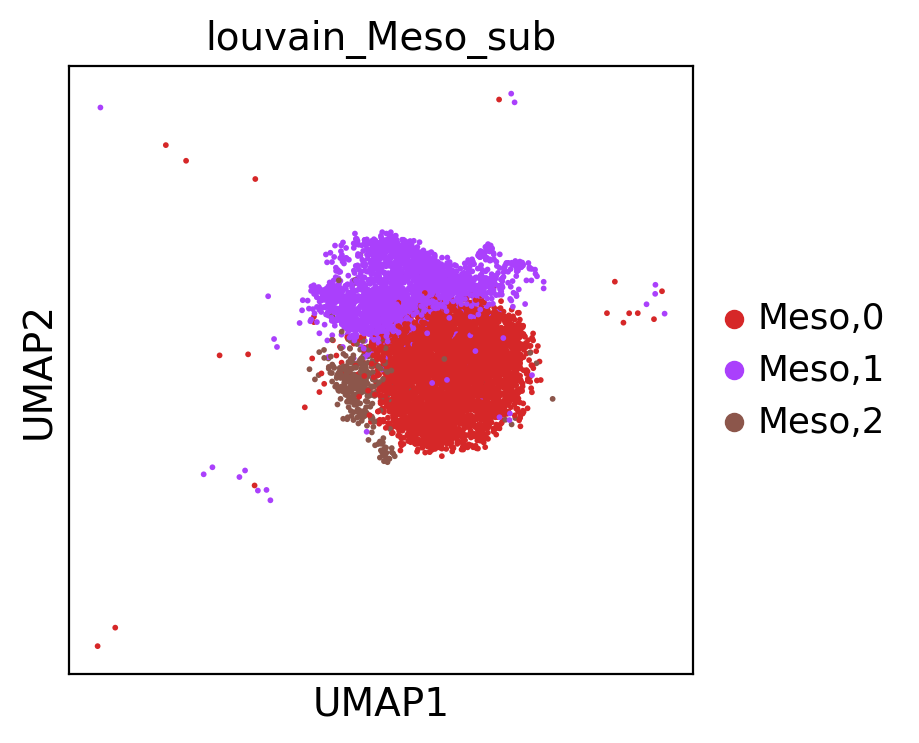

In [96]:
sc.pl.umap(adata[adata.obs["new_clusters"]=="Meso"], color='louvain_Meso_sub')

In [97]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_Meso_sub', key_added='rank_genes_Meso_sub')

ranking genes
    finished (0:00:11)


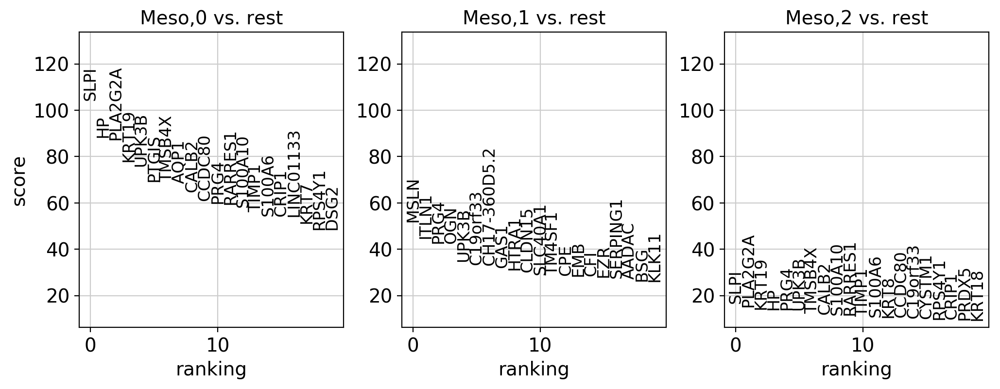

In [99]:
#Plot the new marker genes
Meso_clusters = [i for i in np.unique(adata.obs["louvain_Meso_sub"]) if "Meso" in i] 
sc.pl.rank_genes_groups(adata, key='rank_genes_Meso_sub', groups=Meso_clusters, fontsize=12)

**test if subclusters are based on real differences or only noise**:  
plot rank_genes 90-100

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


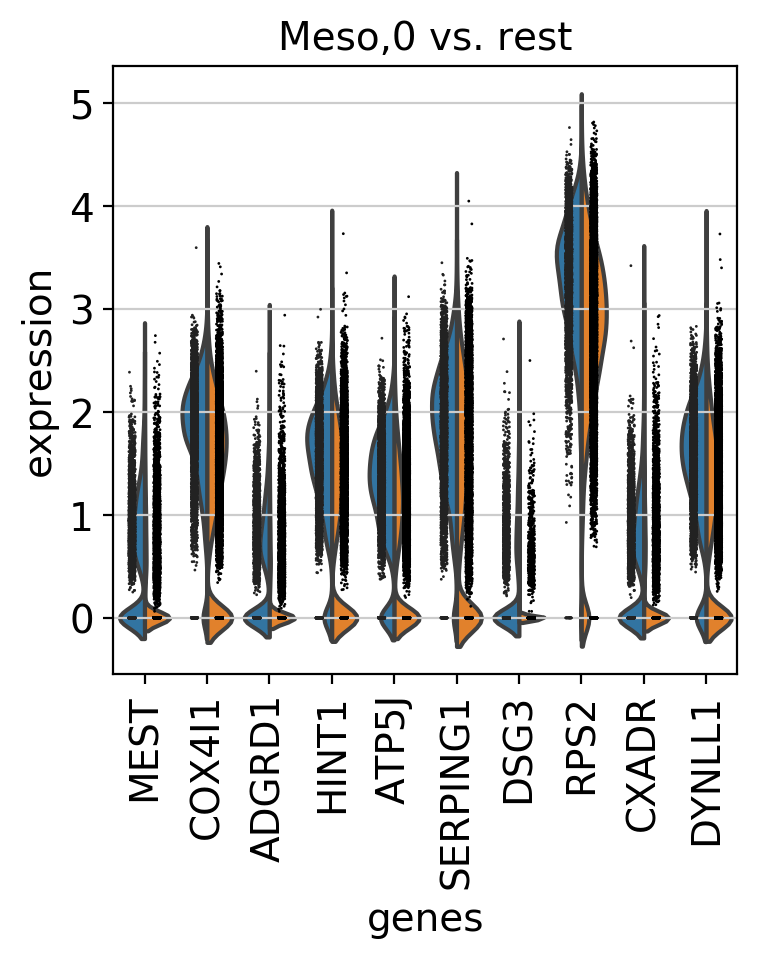

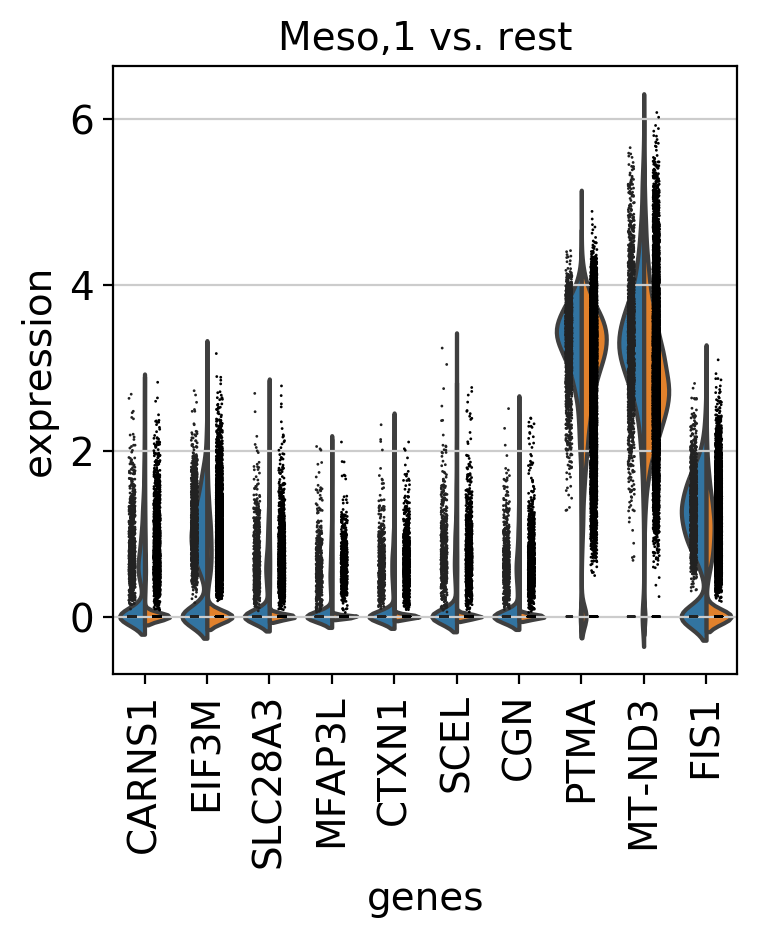

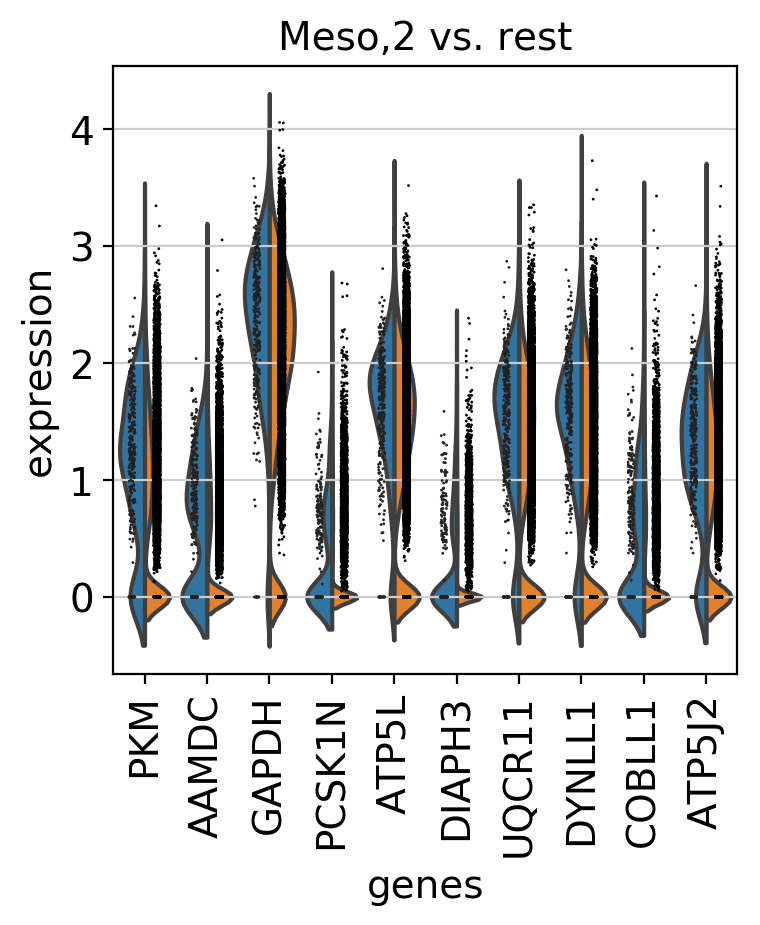

In [100]:
Meso_clusts = [clust for clust in adata.obs['louvain_Meso_sub'].cat.categories if clust.startswith('Meso')]

for clust in Meso_clusts:
    sc.pl.rank_genes_groups_violin(adata, use_raw=True, key='rank_genes_Meso_sub', 
                                   groups=[clust], 
                                   gene_names=adata.uns['rank_genes_Meso_sub']['names'][clust][90:100])

In [8]:
marker_genes_Meso = {"Meso-cells":["KRT5","UPK3B","PDPN","CX3CR1", "CX3CL1", "CCL2","IL6" ]} 

#Find marker overlap
sc.tl.marker_gene_overlap(adata, marker_genes_T, key='rank_genes_T_sub', normalize='reference')

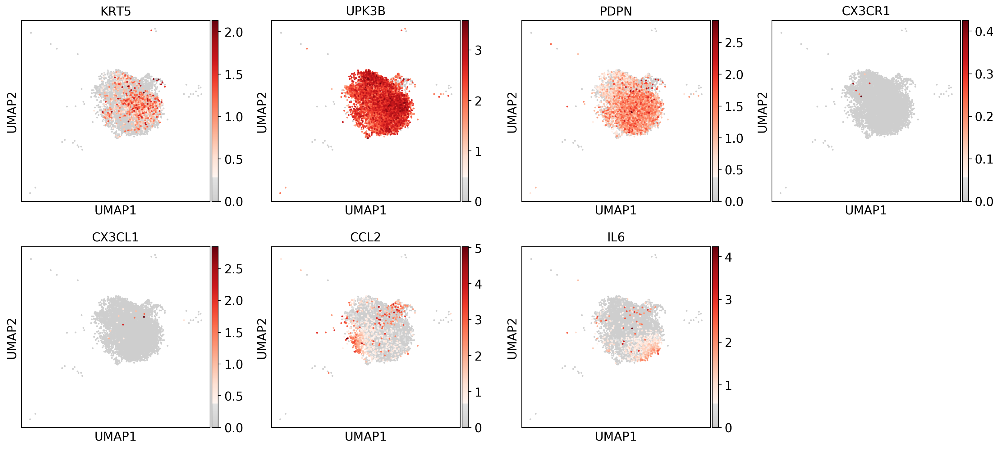

In [102]:
sc.pl.umap(adata[adata.obs["new_clusters"]=="Meso"], color=marker_genes_Meso["Meso-cells"],
           title=marker_genes_Meso["Meso-cells"], color_map=mymap)
#sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color='louvain_T_sub')

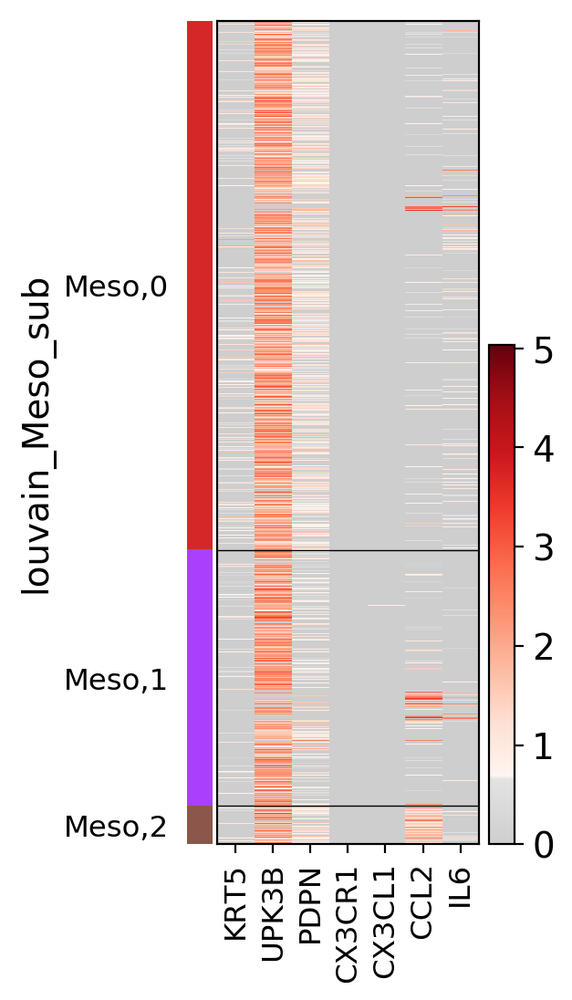

In [106]:
ax = sc.pl.heatmap(adata[adata.obs["new_clusters"]=="Meso"], marker_genes_Meso["Meso-cells"],
                   groupby="louvain_Meso_sub", show_gene_labels=True, cmap=mymap)     

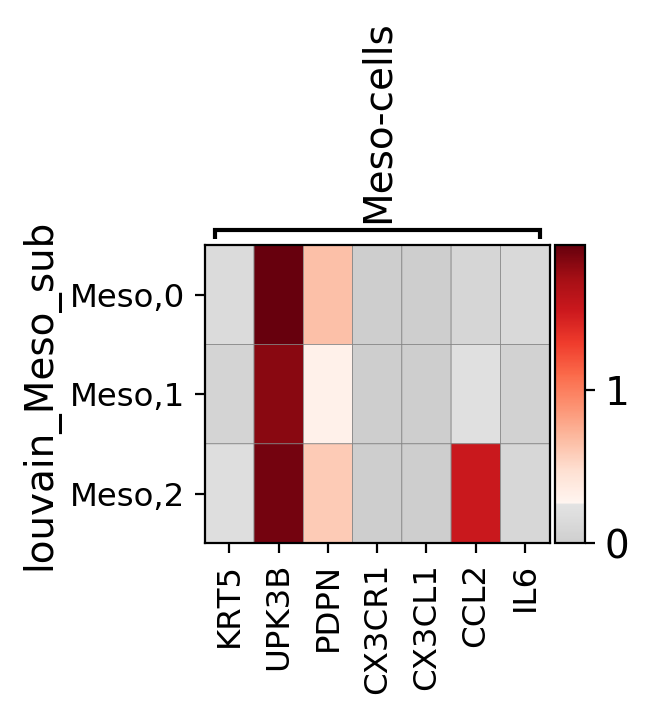

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[2.24, 0, 0.2])

In [104]:
#Matrixplot
sc.pl.matrixplot(adata[adata.obs["new_clusters"]=="Meso"], marker_genes_Meso,
                 groupby='louvain_Meso_sub', cmap=mymap)

In [113]:
import matplotlib.pyplot as plt
print("#Meso-Cells: ", len(adata[adata.obs["new_clusters"]=="Meso"]))
# use raw data _> only normlaized and log tranformed: zero vlaue is still zero!
for m in marker_genes_Meso["Meso-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="Meso"].raw[: , m].X > 0)
    print("#",m, " expressing cells: ",number,
          " (",round(number/len(adata[adata.obs["new_clusters"]=="Meso"])*100, 2),"%)", sep='')

#Meso-Cells:  6974
#KRT5 expressing cells: 1168 (16.75%)
#UPK3B expressing cells: 6540 (93.78%)
#PDPN expressing cells: 4092 (58.68%)
#CX3CR1 expressing cells: 6 (0.09%)
#CX3CL1 expressing cells: 20 (0.29%)
#CCL2 expressing cells: 1166 (16.72%)
#IL6 expressing cells: 810 (11.61%)


In [119]:
import matplotlib.pyplot as plt
nr_batch=len(np.unique(adata.obs["batch"]))
print("normalized for number of samples:")
print("#Meso-Cells: ", len(adata[adata.obs["new_clusters"]=="Meso"])/nr_batch)
# use raw data _> only normlaized and log tranformed: zero vlaue is still zero!
for m in marker_genes_Meso["Meso-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="Meso"].raw[: , m].X > 0)/nr_batch
    print("#",m, " expressing cells: ",number,
          " (",round(number/(len(adata[adata.obs["new_clusters"]=="Meso"])/nr_batch)*100, 2),"%)", sep='')

normalized for number of samples:
#Meso-Cells:  2324.6666666666665
#KRT5 expressing cells: 389.3333333333333 (16.75%)
#UPK3B expressing cells: 2180.0 (93.78%)
#PDPN expressing cells: 1364.0 (58.68%)
#CX3CR1 expressing cells: 2.0 (0.09%)
#CX3CL1 expressing cells: 6.666666666666667 (0.29%)
#CCL2 expressing cells: 388.6666666666667 (16.72%)
#IL6 expressing cells: 270.0 (11.61%)


In [9]:
print("#Meso-Cells: ", np.unique(adata[adata.obs["new_clusters"]=="Meso"].obs["batch"], return_counts=True))
for b in np.unique(adata.obs["batch"]):
    print(b)
    for m in marker_genes_Meso["Meso-cells"]:
        number = sum(adata[(adata.obs["new_clusters"]=="Meso") & (adata.obs["batch"]==b)].raw[: , m].X > 0)
        print("#",m, " expressing cells: ",number,
              " (",round(number/(len(adata[(adata.obs["new_clusters"]=="Meso") & (adata.obs["batch"]==b)]))*100, 2),"%)", sep='')

#Meso-Cells:  (array(['batch_0', 'batch_1', 'batch_2'], dtype=object), array([4845,  277, 1852]))
batch_0


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


#KRT5 expressing cells: 928 (19.15%)
#UPK3B expressing cells: 4728 (97.59%)
#PDPN expressing cells: 3291 (67.93%)
#CX3CR1 expressing cells: 0 (0.0%)
#CX3CL1 expressing cells: 4 (0.08%)
#CCL2 expressing cells: 716 (14.78%)
#IL6 expressing cells: 681 (14.06%)
batch_1
#KRT5 expressing cells: 8 (2.89%)
#UPK3B expressing cells: 120 (43.32%)
#PDPN expressing cells: 46 (16.61%)
#CX3CR1 expressing cells: 0 (0.0%)
#CX3CL1 expressing cells: 1 (0.36%)
#CCL2 expressing cells: 180 (64.98%)
#IL6 expressing cells: 60 (21.66%)
batch_2
#KRT5 expressing cells: 232 (12.53%)
#UPK3B expressing cells: 1692 (91.36%)
#PDPN expressing cells: 755 (40.77%)
#CX3CR1 expressing cells: 6 (0.32%)
#CX3CL1 expressing cells: 15 (0.81%)
#CCL2 expressing cells: 270 (14.58%)
#IL6 expressing cells: 69 (3.73%)


In [109]:
adata.write(results_file)

In [2]:
import scanpy as sc
adata = sc.read(data_path+'GSE130888_RAW/H/results_2.h5ad' )
adata

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_2022/lib/python3.9/site-packages/anndata/compat/__init__.py:229: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_2022/lib/python3.9/site-packages/anndata/compat/__init__.py:229: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


AnnData object with n_obs × n_vars = 19026 × 21772
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub', 'louvain_Meso_sub'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'louvain', 'louvain_Meso_sub_colors', 'louvain_T_sub_colors', 'louvain_colors', 'neighbors', 'new_clusters_colors', 'pca', 'rank_genes_Meso_sub', 'rank_genes_T_sub', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [30]:
genes = ["NINJ1","CASP1", "CASP3", "CASP8", 'PADI2', 'PADI1', 'PADI4', "IL1B", "IL18", "ZBP1", "CCL2", "TNF", "IL6"] #"PAD4","PAD1", "PADI3","P53",

In [29]:
[g for g in adata.var.index if g. startswith("TNF")]

['TNFRSF18',
 'TNFRSF4',
 'TNFRSF14',
 'TNFRSF25',
 'TNFRSF9',
 'TNFRSF8',
 'TNFRSF1B',
 'TNFAIP8L2',
 'TNFSF18',
 'TNFSF4',
 'TNFAIP6',
 'TNFSF10',
 'TNFAIP8',
 'TNF',
 'TNFRSF21',
 'TNFAIP3',
 'TNFRSF10B',
 'TNFRSF10C',
 'TNFRSF10D',
 'TNFRSF10A',
 'TNFRSF11B',
 'TNFSF15',
 'TNFSF8',
 'TNFRSF1A',
 'TNFRSF19',
 'TNFSF11',
 'TNFSF13B',
 'TNFAIP2',
 'TNFAIP8L3',
 'TNFRSF12A',
 'TNFRSF17',
 'TNFSF12',
 'TNFSF13',
 'TNFRSF13B',
 'TNFAIP1',
 'TNFRSF11A',
 'TNFAIP8L1',
 'TNFSF9',
 'TNFSF14',
 'TNFRSF13C']

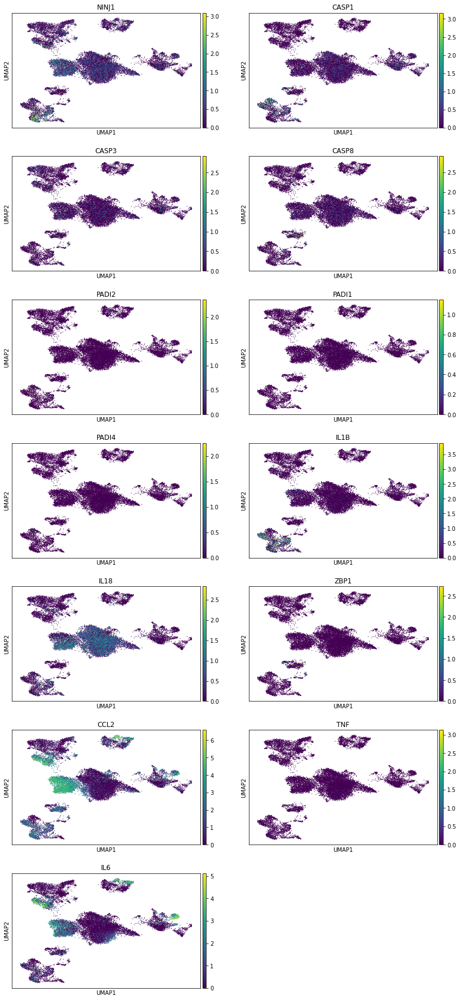

In [31]:
sc.pl.umap(adata, color=genes, ncols=2)

In [17]:
adata

AnnData object with n_obs × n_vars = 19026 × 21772
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub', 'louvain_Meso_sub'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'louvain', 'louvain_Meso_sub_colors', 'louvain_T_sub_colors', 'louvain_colors', 'neighbors', 'new_clusters_colors', 'pca', 'rank_genes_Meso_sub', 'rank_genes_T_sub', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

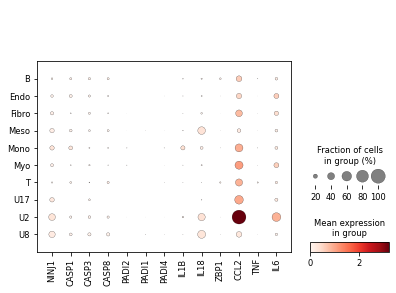

In [32]:
sc.pl.dotplot(adata, var_names=genes, groupby="new_clusters")